# Face Generation
In this project, you'll use generative adversarial networks to generate new images of faces.
### Get the Data
You'll be using two datasets in this project:
- MNIST
- CelebA

Since the celebA dataset is complex and you're doing GANs in a project for the first time, we want you to test your neural network on MNIST before CelebA.  Running the GANs on MNIST will allow you to see how well your model trains sooner.

If you're using [FloydHub](https://www.floydhub.com/), set `data_dir` to "/input" and use the [FloydHub data ID](http://docs.floydhub.com/home/using_datasets/) "R5KrjnANiKVhLWAkpXhNBe".

In [2]:
data_dir = './data'

# FloydHub - Use with data ID "R5KrjnANiKVhLWAkpXhNBe"
#data_dir = '/input'

import pickle as pkl

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import helper

helper.download_extract('mnist', data_dir)
helper.download_extract('celeba', data_dir)

Found mnist Data
Found celeba Data


## Explore the Data
### MNIST
As you're aware, the [MNIST](http://yann.lecun.com/exdb/mnist/) dataset contains images of handwritten digits. You can view the first number of examples by changing `show_n_images`. 

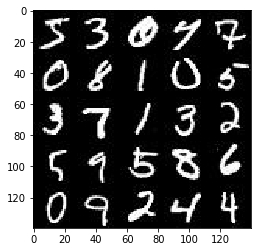

In [3]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
%matplotlib inline
import os
from glob import glob
from matplotlib import pyplot

mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'mnist/*.jpg'))[:show_n_images], 28, 28, 'L')
pyplot.imshow(helper.images_square_grid(mnist_images, 'L'), cmap='gray')

### CelebA
The [CelebFaces Attributes Dataset (CelebA)](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) dataset contains over 200,000 celebrity images with annotations.  Since you're going to be generating faces, you won't need the annotations.  You can view the first number of examples by changing `show_n_images`.

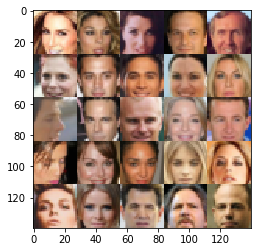

In [4]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'img_align_celeba/*.jpg'))[:show_n_images], 28, 28, 'RGB')
pyplot.imshow(helper.images_square_grid(mnist_images, 'RGB'))

## Preprocess the Data
Since the project's main focus is on building the GANs, we'll preprocess the data for you.  The values of the MNIST and CelebA dataset will be in the range of -0.5 to 0.5 of 28x28 dimensional images.  The CelebA images will be cropped to remove parts of the image that don't include a face, then resized down to 28x28.

The MNIST images are black and white images with a single [color channel](https://en.wikipedia.org/wiki/Channel_(digital_image%29) while the CelebA images have [3 color channels (RGB color channel)](https://en.wikipedia.org/wiki/Channel_(digital_image%29#RGB_Images).
## Build the Neural Network
You'll build the components necessary to build a GANs by implementing the following functions below:
- `model_inputs`
- `discriminator`
- `generator`
- `model_loss`
- `model_opt`
- `train`

### Check the Version of TensorFlow and Access to GPU
This will check to make sure you have the correct version of TensorFlow and access to a GPU

In [5]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
from distutils.version import LooseVersion
import warnings
import tensorflow as tf

# Check TensorFlow Version
assert LooseVersion(tf.__version__) >= LooseVersion('1.0'), 'Please use TensorFlow version 1.0 or newer.  You are using {}'.format(tf.__version__)
print('TensorFlow Version: {}'.format(tf.__version__))

# Check for a GPU
if not tf.test.gpu_device_name():
    warnings.warn('No GPU found. Please use a GPU to train your neural network.')
else:
    print('Default GPU Device: {}'.format(tf.test.gpu_device_name()))

TensorFlow Version: 1.5.0
Default GPU Device: /device:GPU:0


### Input
Implement the `model_inputs` function to create TF Placeholders for the Neural Network. It should create the following placeholders:
- Real input images placeholder with rank 4 using `image_width`, `image_height`, and `image_channels`.
- Z input placeholder with rank 2 using `z_dim`.
- Learning rate placeholder with rank 0.

Return the placeholders in the following the tuple (tensor of real input images, tensor of z data)

In [8]:
import problem_unittests as tests
import tensorflow as tf

# Rank means t
def model_inputs(image_width, image_height, image_channels, z_dim):
    """
    Create the model inputs
    :param image_width: The input image width
    :param image_height: The input image height
    :param image_channels: The number of image channels
    :param z_dim: The dimension of Z
    :return: Tuple of (tensor of real input images, tensor of z data, learning rate)
    """
    # TODO: Implement Function
    input_real = tf.placeholder(tf.float32, (None, image_width, image_height, image_channels), name="input_real")
    input_z = tf.placeholder(tf.float32, (None, z_dim), name="input_z")
    learning_rate = tf.placeholder(tf.float32, [], name="learning_rate")
    
    return input_real, input_z, learning_rate

"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_inputs(model_inputs)

Tests Passed


### Discriminator
Implement `discriminator` to create a discriminator neural network that discriminates on `images`.  This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "discriminator" to allow the variables to be reused.  The function should return a tuple of (tensor output of the discriminator, tensor logits of the discriminator).

In [9]:
def discriminator(images, reuse=False):
    """
    Create the discriminator network
    :param images: Tensor of input image(s)
    :param reuse: Boolean if the weights should be reused
    :return: Tuple of (tensor output of the discriminator, tensor logits of the discriminator)
    """
    # TODO: Implement Function
    
    # Drop out rate
    drop_rate = 0.1
    # Alpha rate for leaky relu
    alpha = 0.2
    kernel_size = 3
    
    n_units = 128
    size_mult = 64
    x = images    
    
    with tf.variable_scope("discriminator", reuse=reuse):
        
        x1 = tf.layers.conv2d(x, size_mult, kernel_size, strides=2, padding='same',
                             kernel_initializer=tf.contrib.layers.xavier_initializer())
        dropout1 = tf.layers.dropout(x1, rate=drop_rate)
        relu1 = tf.maximum(alpha * dropout1, dropout1)
        
        x2 = tf.layers.conv2d(relu1, size_mult * 2, kernel_size, strides=2, padding='same',
                             kernel_initializer=tf.contrib.layers.xavier_initializer())
        bn2 = tf.layers.batch_normalization(x2, training=True)
        dropout2 = tf.layers.dropout(bn2, rate=drop_rate)
        relu2 = tf.maximum(alpha * dropout2, dropout2)
      
        x3 = tf.layers.conv2d(relu2, size_mult * 4, kernel_size, strides=2, padding='same',
                             kernel_initializer=tf.contrib.layers.xavier_initializer())
        bn3 = tf.layers.batch_normalization(x3, training=True)
        relu3 = tf.maximum(alpha * bn3, bn3)

        # Flattening conv layer  
        features = tf.reshape(relu3, [-1, 4 * 4 * 256])
        
        # Set class_logits to be the inputs to a softmax distribution over the different classes
        class_logits = tf.layers.dense(features, 1, activation=None)
        
        # Sigmoid and not softmax. Sigmoid because only 2 classes.
        out = tf.nn.sigmoid(class_logits)
        
    return out, class_logits


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_discriminator(discriminator, tf)

Tests Passed


### Generator
Implement `generator` to generate an image using `z`. This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "generator" to allow the variables to be reused. The function should return the generated 28 x 28 x `out_channel_dim` images.

In [10]:
def generator(z, out_channel_dim, is_train=True):
    """
    Create the generator network
    :param z: Input z
    :param out_channel_dim: The number of channels in the output image
    :param is_train: Boolean if generator is being used for training
    :return: The tensor output of the generator
    """
    # TODO: Implement Function
    
    reuse = not is_train
    alpha = 0.2
    n_units = 128
    kernel = 5
    stride = 2
    
    with tf.variable_scope("generator", reuse=reuse):
        
        # fully connected layer
        fc = tf.layers.dense(z, 2 * 2 * n_units * 4, activation=None)
        x1 = tf.reshape(fc, [-1, 2, 2, n_units * 4])   
        x1 = tf.layers.batch_normalization(x1, training=is_train)
        x1 = tf.maximum(alpha * x1, x1)
        
        x2 = tf.layers.conv2d_transpose(x1, n_units * 2, kernel, strides = stride, padding="valid",
                             kernel_initializer=tf.contrib.layers.xavier_initializer())
        x2 = tf.layers.batch_normalization(x2, training=is_train)
        x2 = tf.maximum(alpha * x2, x2)

        x3 = tf.layers.conv2d_transpose(x2, n_units, kernel, stride, padding="same",
                             kernel_initializer=tf.contrib.layers.xavier_initializer())
        x3 = tf.layers.batch_normalization(x3, training=is_train)
        x3 = tf.maximum(alpha * x3, x3)
        
        # Output layer
        logits = tf.layers.conv2d_transpose(x3, out_channel_dim, kernel, strides=stride, padding="same",
                             kernel_initializer=tf.contrib.layers.xavier_initializer())
        
        out = tf.tanh(logits)

        
    return out


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_generator(generator, tf)

Tests Passed


### Loss
Implement `model_loss` to build the GANs for training and calculate the loss.  The function should return a tuple of (discriminator loss, generator loss).  Use the following functions you implemented:
- `discriminator(images, reuse=False)`
- `generator(z, out_channel_dim, is_train=True)`

In [11]:
def model_loss(input_real, input_z, out_channel_dim):
    """
    Get the loss for the discriminator and generator
    :param input_real: Images from the real dataset
    :param input_z: Z input
    :param out_channel_dim: The number of channels in the output image
    :return: A tuple of (discriminator loss, generator loss)
    """
    # TODO: Implement Function
    g_model = generator(input_z, out_channel_dim)
    
    d_model_real, d_logits_real = discriminator(input_real)
    d_model_fake, d_logits_fake = discriminator(g_model, reuse=True)
    
    # discriminator loss for the reals
    d_loss_real = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(
            logits=d_logits_real, 
            labels=tf.ones_like(d_model_real)
        )
    )
    
    # Discriminator loss for the fakes
    d_loss_fake = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(
            logits=d_logits_fake,
            labels=tf.zeros_like(d_model_fake)
        )
    )
    
    # Summing the discriminator loss for reals and fake
    total_d_loss = d_loss_real + d_loss_fake
    
    # Generator loss
    g_loss = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(
            logits=d_logits_fake, 
            labels=tf.ones_like(d_model_fake)
        )
    )
    
    return total_d_loss, g_loss


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_loss(model_loss)

Tests Passed


### Optimization
Implement `model_opt` to create the optimization operations for the GANs. Use [`tf.trainable_variables`](https://www.tensorflow.org/api_docs/python/tf/trainable_variables) to get all the trainable variables.  Filter the variables with names that are in the discriminator and generator scope names.  The function should return a tuple of (discriminator training operation, generator training operation).

In [12]:
def model_opt(d_loss, g_loss, learning_rate, beta1):
    """
    Get optimization operations
    :param d_loss: Discriminator loss Tensor
    :param g_loss: Generator loss Tensor
    :param learning_rate: Learning Rate Placeholder
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :return: A tuple of (discriminator training operation, generator training operation)
    """
    # TODO: Implement Function
        
    # NN vars
    disc_vars = tf.trainable_variables("discriminator")
    gen_vars = tf.trainable_variables("generator")

    # Optimize 
    disc_trained = tf.train.AdamOptimizer(learning_rate, beta1).minimize(d_loss, var_list = disc_vars)
        
    updates = tf.get_collection(tf.GraphKeys.UPDATE_OPS)
    g_updates = [opt for opt in updates if opt.name.startswith("generator")]
    with tf.control_dependencies(tf.get_collection(tf.GraphKeys.UPDATE_OPS)):
        g_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(g_loss, var_list=gen_vars)
    
    d_train_opt = disc_trained
    
    return d_train_opt, g_train_opt


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_opt(model_opt, tf)

Tests Passed


## Neural Network Training
### Show Output
Use this function to show the current output of the generator during training. It will help you determine how well the GANs is training.

In [13]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import numpy as np

def show_generator_output(sess, n_images, input_z, out_channel_dim, image_mode):
    """
    Show example output for the generator
    :param sess: TensorFlow session
    :param n_images: Number of Images to display
    :param input_z: Input Z Tensor
    :param out_channel_dim: The number of channels in the output image
    :param image_mode: The mode to use for images ("RGB" or "L")
    """
    cmap = None if image_mode == 'RGB' else 'gray'
    z_dim = input_z.get_shape().as_list()[-1]
    example_z = np.random.uniform(-1, 1, size=[n_images, z_dim])

    samples = sess.run(
        generator(input_z, out_channel_dim, False),
        feed_dict={input_z: example_z})

    images_grid = helper.images_square_grid(samples, image_mode)
    pyplot.imshow(images_grid, cmap=cmap)
    pyplot.show()

### Train
Implement `train` to build and train the GANs.  Use the following functions you implemented:
- `model_inputs(image_width, image_height, image_channels, z_dim)`
- `model_loss(input_real, input_z, out_channel_dim)`
- `model_opt(d_loss, g_loss, learning_rate, beta1)`

Use the `show_generator_output` to show `generator` output while you train. Running `show_generator_output` for every batch will drastically increase training time and increase the size of the notebook.  It's recommended to print the `generator` output every 100 batches.

In [14]:
import time

def train(epoch_count, batch_size, z_dim, learning_rate, beta1, get_batches, data_shape, data_image_mode):
    """
    Train the GAN
    :param epoch_count: Number of epochs
    :param batch_size: Batch Size
    :param z_dim: Z dimension
    :param learning_rate: Learning Rate
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :param get_batches: Function to get batches
    :param data_shape: Shape of the data
    :param data_image_mode: The image mode to use for images ("RGB" or "L")
    """
    # TODO: Build Model
    #saver = tf.train.Saver()
    sample_z = np.random.normal(-0.8, 1, size=(batch_size, z_dim))

    samples, train_accuracies, test_accuracies = [], [], []
    steps = 0    
    
    print_every = 50
    show_every = 250
    images_to_show = 25
    
    print(data_shape)
    width, height, channels = data_shape[1:]
    print("width: {}, height: {}, channels: {}".format(width, height, channels))
    print("Channel mode: {}".format(data_image_mode))
    
    
    # Getting the variables required for training 
    input_real, input_z, some_learning_rate = model_inputs(width, height, channels, z_dim)
    
    # Should use the channel mode to calculate the channels but using the number of channels works too
    d_loss, g_loss = model_loss(input_real, input_z, channels)
    
    # Optimization
    d_train_opt, g_train_opt = model_opt(d_loss, g_loss, learning_rate, beta1)
    
    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        for e in range(epoch_count):
            for batch_images in get_batches(batch_size):
                # TODO: Train Model
                            
                batch_images *= 2.0
                    
                steps += 1
                
                # Sample random noise for G
                batch_z = np.random.uniform(-0.8, 1, size=(batch_size, z_dim))
                
                # Run the optimizer for discriminator
                _ = sess.run(
                    d_train_opt, 
                    feed_dict={
                        input_real: batch_images, 
                        input_z: batch_z,
                        some_learning_rate:learning_rate
                    }
                )
                
                # Run the optimizer for the generator
                _ = sess.run(
                    g_train_opt,
                    feed_dict={
                        input_z: batch_z, 
                        input_real: batch_images,
                        some_learning_rate:learning_rate
                    }
                )
                
                # Print out the losses
                if steps % print_every == 0:
                    train_loss_d = d_loss.eval({
                        input_real: batch_images,
                        input_z: batch_z
                    })
                    train_loss_g = g_loss.eval({
                        input_z: batch_z, 
                        input_real: batch_images
                    })
                    print("Epoch {}/{}...".format(e+1, epochs),
                          "Discriminator Loss: {:.4f}...".format(train_loss_d),
                          "Generator Loss: {:.4f}".format(train_loss_g))
                
                # Show the generator output
                if steps % show_every == 0:
                    show_generator_output(
                        sess,
                        images_to_show,
                        input_z, 
                        channels,
                        data_image_mode
                    )
        #saver.save(sess, './checkpoints/generator.ckpt')

    with open('samples.pkl', 'wb') as f:
        pkl.dump(samples, f)
            


### MNIST
Test your GANs architecture on MNIST.  After 2 epochs, the GANs should be able to generate images that look like handwritten digits.  Make sure the loss of the generator is lower than the loss of the discriminator or close to 0.

(60000, 28, 28, 1)
width: 28, height: 28, channels: 1
Channel mode: L
Epoch 1/5... Discriminator Loss: 1.4317... Generator Loss: 0.3957
Epoch 1/5... Discriminator Loss: 0.2764... Generator Loss: 1.7129
Epoch 1/5... Discriminator Loss: 0.5306... Generator Loss: 1.9253
Epoch 1/5... Discriminator Loss: 0.7985... Generator Loss: 1.0396
Epoch 1/5... Discriminator Loss: 1.4452... Generator Loss: 0.4065


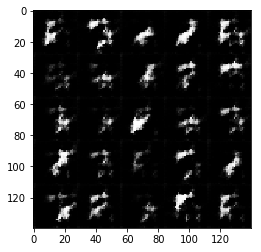

Epoch 1/5... Discriminator Loss: 0.6322... Generator Loss: 1.2927
Epoch 1/5... Discriminator Loss: 1.7811... Generator Loss: 0.3201
Epoch 1/5... Discriminator Loss: 0.4734... Generator Loss: 1.6226
Epoch 1/5... Discriminator Loss: 1.1455... Generator Loss: 0.5395
Epoch 1/5... Discriminator Loss: 0.9013... Generator Loss: 1.3247


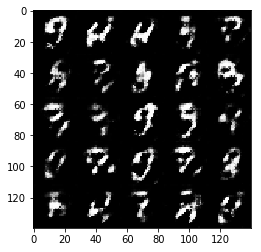

Epoch 1/5... Discriminator Loss: 0.6647... Generator Loss: 1.2202
Epoch 1/5... Discriminator Loss: 1.1843... Generator Loss: 0.5920
Epoch 1/5... Discriminator Loss: 1.0210... Generator Loss: 1.1831
Epoch 1/5... Discriminator Loss: 1.4676... Generator Loss: 0.3669
Epoch 1/5... Discriminator Loss: 1.0296... Generator Loss: 0.9444


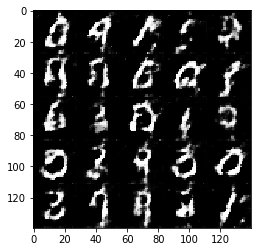

Epoch 1/5... Discriminator Loss: 1.3309... Generator Loss: 1.7406
Epoch 1/5... Discriminator Loss: 1.4865... Generator Loss: 0.3780
Epoch 1/5... Discriminator Loss: 1.7250... Generator Loss: 0.3920
Epoch 1/5... Discriminator Loss: 0.8529... Generator Loss: 1.0204
Epoch 1/5... Discriminator Loss: 1.4659... Generator Loss: 0.3366


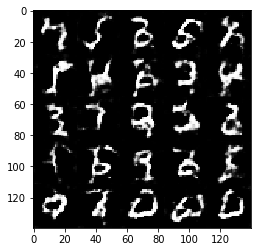

Epoch 1/5... Discriminator Loss: 1.1752... Generator Loss: 0.6024
Epoch 1/5... Discriminator Loss: 1.2981... Generator Loss: 0.4080
Epoch 1/5... Discriminator Loss: 1.4226... Generator Loss: 0.3994
Epoch 1/5... Discriminator Loss: 1.1454... Generator Loss: 1.5889
Epoch 1/5... Discriminator Loss: 1.1051... Generator Loss: 1.3249


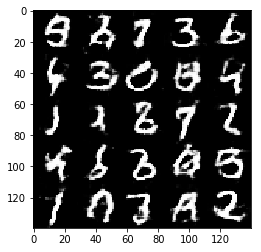

Epoch 1/5... Discriminator Loss: 1.9756... Generator Loss: 0.1886
Epoch 1/5... Discriminator Loss: 1.0465... Generator Loss: 0.7482
Epoch 1/5... Discriminator Loss: 1.0746... Generator Loss: 0.7871
Epoch 1/5... Discriminator Loss: 1.0588... Generator Loss: 0.7369
Epoch 1/5... Discriminator Loss: 1.1824... Generator Loss: 0.4932


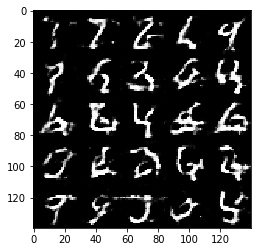

Epoch 1/5... Discriminator Loss: 1.3362... Generator Loss: 0.4575
Epoch 1/5... Discriminator Loss: 0.6888... Generator Loss: 1.1685
Epoch 1/5... Discriminator Loss: 0.9174... Generator Loss: 0.7005
Epoch 1/5... Discriminator Loss: 1.2807... Generator Loss: 0.4225
Epoch 1/5... Discriminator Loss: 0.4168... Generator Loss: 1.3617


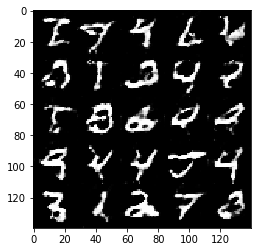

Epoch 1/5... Discriminator Loss: 0.9613... Generator Loss: 0.5841
Epoch 1/5... Discriminator Loss: 4.0328... Generator Loss: 0.0399
Epoch 1/5... Discriminator Loss: 0.6171... Generator Loss: 1.0884
Epoch 1/5... Discriminator Loss: 0.7198... Generator Loss: 0.8300
Epoch 1/5... Discriminator Loss: 0.6681... Generator Loss: 0.9975


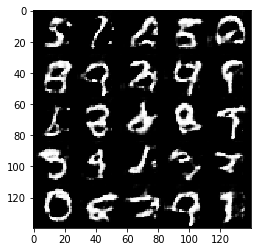

Epoch 1/5... Discriminator Loss: 0.7201... Generator Loss: 1.5430
Epoch 1/5... Discriminator Loss: 0.5411... Generator Loss: 1.1766
Epoch 1/5... Discriminator Loss: 0.3431... Generator Loss: 1.5610
Epoch 1/5... Discriminator Loss: 0.7858... Generator Loss: 1.1215
Epoch 1/5... Discriminator Loss: 0.6158... Generator Loss: 1.0930


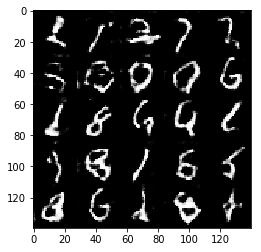

Epoch 1/5... Discriminator Loss: 2.3901... Generator Loss: 0.1603
Epoch 1/5... Discriminator Loss: 0.5727... Generator Loss: 1.0841
Epoch 1/5... Discriminator Loss: 0.4817... Generator Loss: 1.2148
Epoch 1/5... Discriminator Loss: 0.3333... Generator Loss: 1.6634
Epoch 1/5... Discriminator Loss: 1.7690... Generator Loss: 6.3838


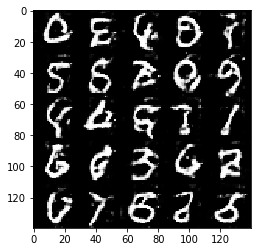

Epoch 1/5... Discriminator Loss: 0.8880... Generator Loss: 0.7905
Epoch 1/5... Discriminator Loss: 1.1754... Generator Loss: 0.4775
Epoch 1/5... Discriminator Loss: 0.5820... Generator Loss: 2.8096
Epoch 1/5... Discriminator Loss: 0.8570... Generator Loss: 3.3466
Epoch 1/5... Discriminator Loss: 0.7866... Generator Loss: 0.8927


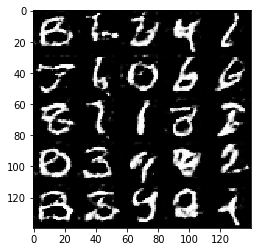

Epoch 1/5... Discriminator Loss: 0.9317... Generator Loss: 0.6630
Epoch 1/5... Discriminator Loss: 0.3843... Generator Loss: 1.6738
Epoch 1/5... Discriminator Loss: 0.5165... Generator Loss: 1.0673
Epoch 1/5... Discriminator Loss: 2.4775... Generator Loss: 0.1395
Epoch 1/5... Discriminator Loss: 0.5521... Generator Loss: 1.2512


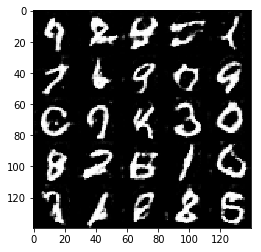

Epoch 1/5... Discriminator Loss: 0.2598... Generator Loss: 2.0748
Epoch 1/5... Discriminator Loss: 1.0661... Generator Loss: 0.5917
Epoch 1/5... Discriminator Loss: 1.6321... Generator Loss: 0.3108
Epoch 1/5... Discriminator Loss: 0.9773... Generator Loss: 0.7193
Epoch 1/5... Discriminator Loss: 0.6635... Generator Loss: 0.8678


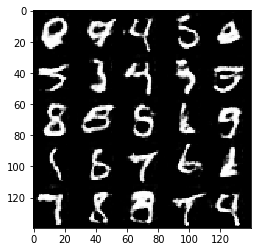

Epoch 1/5... Discriminator Loss: 0.6290... Generator Loss: 0.9904
Epoch 1/5... Discriminator Loss: 0.5379... Generator Loss: 1.0519
Epoch 1/5... Discriminator Loss: 0.7573... Generator Loss: 0.8155
Epoch 1/5... Discriminator Loss: 0.7627... Generator Loss: 1.1805
Epoch 1/5... Discriminator Loss: 0.3579... Generator Loss: 1.4573


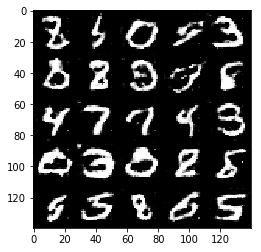

Epoch 1/5... Discriminator Loss: 0.2480... Generator Loss: 1.7849
Epoch 1/5... Discriminator Loss: 0.8205... Generator Loss: 1.2526
Epoch 1/5... Discriminator Loss: 1.6573... Generator Loss: 0.3613
Epoch 1/5... Discriminator Loss: 0.3356... Generator Loss: 1.9704
Epoch 1/5... Discriminator Loss: 0.6270... Generator Loss: 1.2448


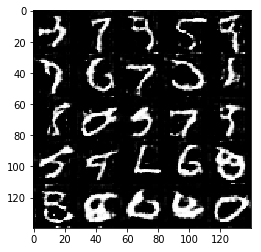

Epoch 2/5... Discriminator Loss: 0.6004... Generator Loss: 1.1658
Epoch 2/5... Discriminator Loss: 0.3772... Generator Loss: 1.6393
Epoch 2/5... Discriminator Loss: 1.4829... Generator Loss: 0.3875
Epoch 2/5... Discriminator Loss: 0.2576... Generator Loss: 2.0869
Epoch 2/5... Discriminator Loss: 0.3718... Generator Loss: 1.5191


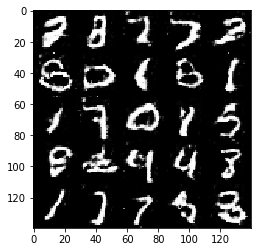

Epoch 2/5... Discriminator Loss: 0.6734... Generator Loss: 1.1422
Epoch 2/5... Discriminator Loss: 0.7098... Generator Loss: 1.0093
Epoch 2/5... Discriminator Loss: 0.4006... Generator Loss: 1.5046
Epoch 2/5... Discriminator Loss: 0.3602... Generator Loss: 2.1521
Epoch 2/5... Discriminator Loss: 0.3725... Generator Loss: 1.5282


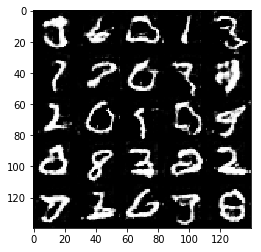

Epoch 2/5... Discriminator Loss: 1.8936... Generator Loss: 0.2403
Epoch 2/5... Discriminator Loss: 0.7495... Generator Loss: 0.8454
Epoch 2/5... Discriminator Loss: 0.9606... Generator Loss: 0.7041
Epoch 2/5... Discriminator Loss: 0.5277... Generator Loss: 1.2242
Epoch 2/5... Discriminator Loss: 0.5504... Generator Loss: 1.0862


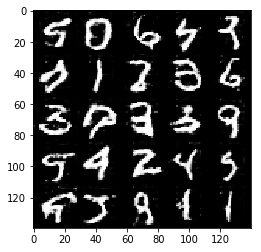

Epoch 2/5... Discriminator Loss: 0.2374... Generator Loss: 1.9098
Epoch 2/5... Discriminator Loss: 0.5331... Generator Loss: 1.1497
Epoch 2/5... Discriminator Loss: 0.7345... Generator Loss: 0.8524
Epoch 2/5... Discriminator Loss: 0.2226... Generator Loss: 2.1540
Epoch 2/5... Discriminator Loss: 0.3992... Generator Loss: 1.3665


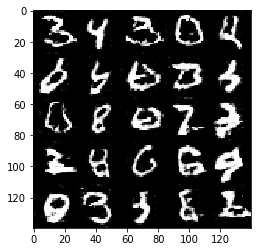

Epoch 2/5... Discriminator Loss: 0.4731... Generator Loss: 1.2482
Epoch 2/5... Discriminator Loss: 1.1082... Generator Loss: 0.6555
Epoch 2/5... Discriminator Loss: 0.7694... Generator Loss: 0.9396
Epoch 2/5... Discriminator Loss: 0.4776... Generator Loss: 1.2490
Epoch 2/5... Discriminator Loss: 0.4335... Generator Loss: 1.6268


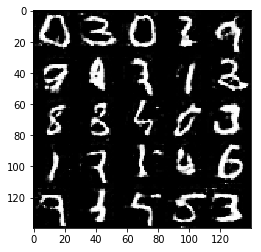

Epoch 2/5... Discriminator Loss: 0.9356... Generator Loss: 0.8133
Epoch 2/5... Discriminator Loss: 0.4748... Generator Loss: 2.3897
Epoch 2/5... Discriminator Loss: 0.4430... Generator Loss: 1.4820
Epoch 2/5... Discriminator Loss: 2.2195... Generator Loss: 0.1670
Epoch 2/5... Discriminator Loss: 0.7727... Generator Loss: 0.8323


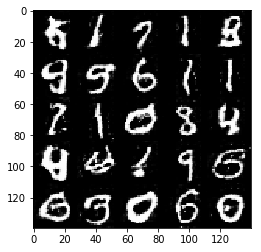

Epoch 2/5... Discriminator Loss: 1.6702... Generator Loss: 0.3305
Epoch 2/5... Discriminator Loss: 0.8899... Generator Loss: 0.6677
Epoch 2/5... Discriminator Loss: 1.0698... Generator Loss: 0.6669
Epoch 2/5... Discriminator Loss: 0.2626... Generator Loss: 2.2484
Epoch 2/5... Discriminator Loss: 0.8167... Generator Loss: 0.8902


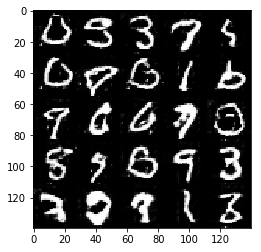

Epoch 2/5... Discriminator Loss: 0.2913... Generator Loss: 3.1435
Epoch 2/5... Discriminator Loss: 0.4629... Generator Loss: 1.4628
Epoch 2/5... Discriminator Loss: 1.1024... Generator Loss: 0.7416
Epoch 2/5... Discriminator Loss: 0.5275... Generator Loss: 1.1478
Epoch 2/5... Discriminator Loss: 0.4847... Generator Loss: 1.3559


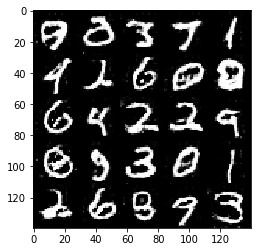

Epoch 2/5... Discriminator Loss: 0.7115... Generator Loss: 0.9531
Epoch 2/5... Discriminator Loss: 0.3042... Generator Loss: 2.7855
Epoch 2/5... Discriminator Loss: 1.0581... Generator Loss: 0.6885
Epoch 2/5... Discriminator Loss: 0.2059... Generator Loss: 2.0066
Epoch 2/5... Discriminator Loss: 0.3914... Generator Loss: 1.5007


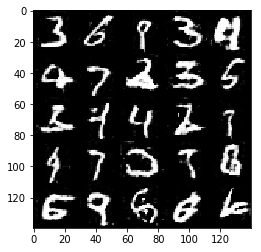

Epoch 2/5... Discriminator Loss: 1.4830... Generator Loss: 0.4545
Epoch 2/5... Discriminator Loss: 0.2853... Generator Loss: 1.9677
Epoch 2/5... Discriminator Loss: 0.6964... Generator Loss: 0.9631
Epoch 2/5... Discriminator Loss: 0.3807... Generator Loss: 1.9428
Epoch 2/5... Discriminator Loss: 1.0273... Generator Loss: 0.5801


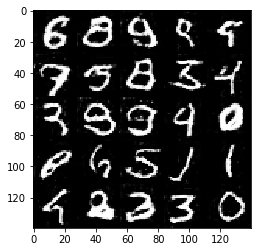

Epoch 2/5... Discriminator Loss: 0.4581... Generator Loss: 1.3389
Epoch 2/5... Discriminator Loss: 0.5196... Generator Loss: 1.2639
Epoch 2/5... Discriminator Loss: 0.8282... Generator Loss: 1.0240
Epoch 2/5... Discriminator Loss: 0.2898... Generator Loss: 2.3870
Epoch 2/5... Discriminator Loss: 0.5006... Generator Loss: 1.3504


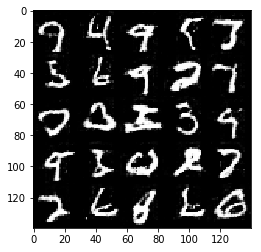

Epoch 2/5... Discriminator Loss: 0.8769... Generator Loss: 0.7288
Epoch 2/5... Discriminator Loss: 1.4412... Generator Loss: 0.4350
Epoch 2/5... Discriminator Loss: 1.1970... Generator Loss: 0.4764
Epoch 2/5... Discriminator Loss: 0.7267... Generator Loss: 1.0503
Epoch 2/5... Discriminator Loss: 0.9715... Generator Loss: 0.9284


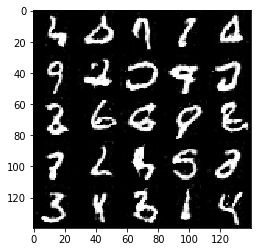

Epoch 2/5... Discriminator Loss: 0.7431... Generator Loss: 0.7800
Epoch 2/5... Discriminator Loss: 0.3180... Generator Loss: 2.3596
Epoch 2/5... Discriminator Loss: 1.4691... Generator Loss: 0.3789
Epoch 2/5... Discriminator Loss: 0.7449... Generator Loss: 0.9367
Epoch 2/5... Discriminator Loss: 0.8992... Generator Loss: 0.7619


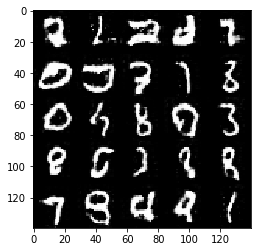

Epoch 2/5... Discriminator Loss: 0.4436... Generator Loss: 1.3320
Epoch 2/5... Discriminator Loss: 0.2066... Generator Loss: 2.3358
Epoch 2/5... Discriminator Loss: 0.6665... Generator Loss: 0.8374
Epoch 2/5... Discriminator Loss: 0.1668... Generator Loss: 2.5530
Epoch 2/5... Discriminator Loss: 1.6687... Generator Loss: 0.3408


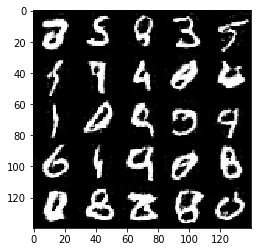

Epoch 2/5... Discriminator Loss: 0.4069... Generator Loss: 1.6445
Epoch 2/5... Discriminator Loss: 0.7660... Generator Loss: 0.8453
Epoch 2/5... Discriminator Loss: 0.8126... Generator Loss: 0.7330
Epoch 2/5... Discriminator Loss: 1.1950... Generator Loss: 0.5861
Epoch 2/5... Discriminator Loss: 0.4161... Generator Loss: 1.3648


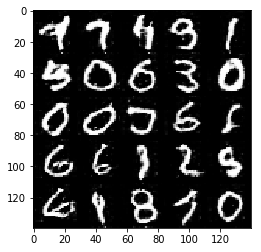

Epoch 3/5... Discriminator Loss: 0.5841... Generator Loss: 1.0971
Epoch 3/5... Discriminator Loss: 0.9546... Generator Loss: 0.6342
Epoch 3/5... Discriminator Loss: 0.1615... Generator Loss: 3.0551
Epoch 3/5... Discriminator Loss: 0.3557... Generator Loss: 1.9497
Epoch 3/5... Discriminator Loss: 1.8225... Generator Loss: 0.2834


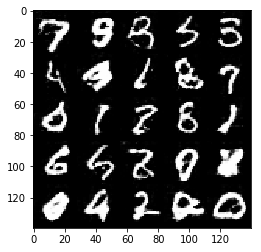

Epoch 3/5... Discriminator Loss: 0.7465... Generator Loss: 0.9464
Epoch 3/5... Discriminator Loss: 0.2853... Generator Loss: 1.9545
Epoch 3/5... Discriminator Loss: 2.0456... Generator Loss: 0.2180
Epoch 3/5... Discriminator Loss: 0.7390... Generator Loss: 1.0847
Epoch 3/5... Discriminator Loss: 0.6039... Generator Loss: 1.0609


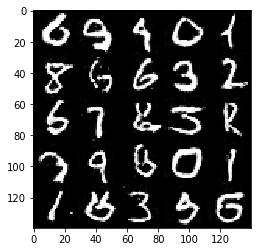

Epoch 3/5... Discriminator Loss: 0.8424... Generator Loss: 0.9719
Epoch 3/5... Discriminator Loss: 1.5810... Generator Loss: 0.3854
Epoch 3/5... Discriminator Loss: 0.7944... Generator Loss: 0.7603
Epoch 3/5... Discriminator Loss: 0.2837... Generator Loss: 3.1066
Epoch 3/5... Discriminator Loss: 1.3331... Generator Loss: 0.5379


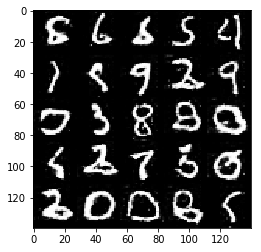

Epoch 3/5... Discriminator Loss: 0.5117... Generator Loss: 1.3679
Epoch 3/5... Discriminator Loss: 1.0733... Generator Loss: 0.6112
Epoch 3/5... Discriminator Loss: 0.4024... Generator Loss: 1.3267
Epoch 3/5... Discriminator Loss: 0.4091... Generator Loss: 1.5520
Epoch 3/5... Discriminator Loss: 0.4104... Generator Loss: 1.3926


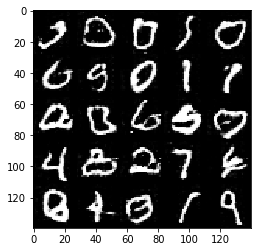

Epoch 3/5... Discriminator Loss: 0.1444... Generator Loss: 3.7017
Epoch 3/5... Discriminator Loss: 0.6690... Generator Loss: 1.4840
Epoch 3/5... Discriminator Loss: 1.7141... Generator Loss: 0.3298
Epoch 3/5... Discriminator Loss: 0.6735... Generator Loss: 0.9886
Epoch 3/5... Discriminator Loss: 0.4728... Generator Loss: 1.3017


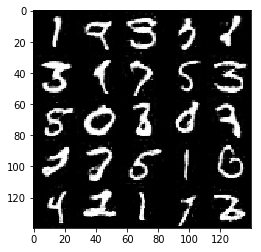

Epoch 3/5... Discriminator Loss: 1.8120... Generator Loss: 0.2747
Epoch 3/5... Discriminator Loss: 0.3609... Generator Loss: 3.4965
Epoch 3/5... Discriminator Loss: 0.9277... Generator Loss: 0.9121
Epoch 3/5... Discriminator Loss: 0.9563... Generator Loss: 0.8747
Epoch 3/5... Discriminator Loss: 0.5509... Generator Loss: 1.4530


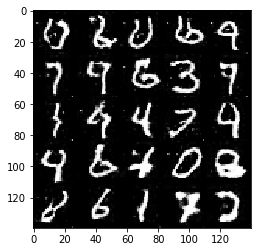

Epoch 3/5... Discriminator Loss: 1.0986... Generator Loss: 1.0591
Epoch 3/5... Discriminator Loss: 1.6453... Generator Loss: 0.3701
Epoch 3/5... Discriminator Loss: 1.4674... Generator Loss: 0.4220
Epoch 3/5... Discriminator Loss: 0.9072... Generator Loss: 0.7475
Epoch 3/5... Discriminator Loss: 0.7420... Generator Loss: 1.1572


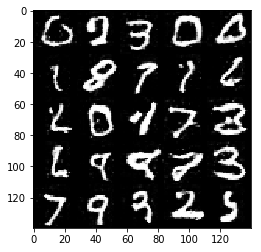

Epoch 3/5... Discriminator Loss: 0.8427... Generator Loss: 1.0226
Epoch 3/5... Discriminator Loss: 0.5421... Generator Loss: 1.3416
Epoch 3/5... Discriminator Loss: 0.5516... Generator Loss: 1.6580
Epoch 3/5... Discriminator Loss: 0.9324... Generator Loss: 0.9232
Epoch 3/5... Discriminator Loss: 0.2089... Generator Loss: 2.7737


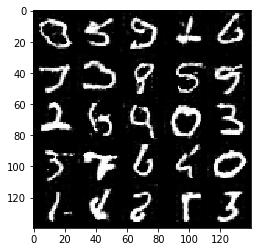

Epoch 3/5... Discriminator Loss: 1.4009... Generator Loss: 0.4539
Epoch 3/5... Discriminator Loss: 0.5711... Generator Loss: 1.7083
Epoch 3/5... Discriminator Loss: 1.4194... Generator Loss: 0.4313
Epoch 3/5... Discriminator Loss: 0.6712... Generator Loss: 1.1157
Epoch 3/5... Discriminator Loss: 0.6139... Generator Loss: 1.1311


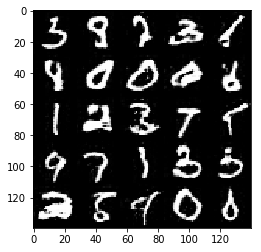

Epoch 3/5... Discriminator Loss: 1.5065... Generator Loss: 0.4968
Epoch 3/5... Discriminator Loss: 0.2960... Generator Loss: 2.2634
Epoch 3/5... Discriminator Loss: 1.3203... Generator Loss: 0.4321
Epoch 3/5... Discriminator Loss: 0.8386... Generator Loss: 0.8458
Epoch 3/5... Discriminator Loss: 0.5792... Generator Loss: 1.4684


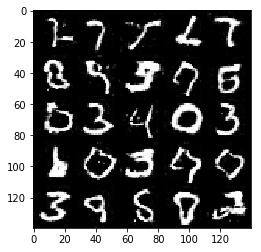

Epoch 3/5... Discriminator Loss: 0.5981... Generator Loss: 1.1780
Epoch 3/5... Discriminator Loss: 0.8426... Generator Loss: 0.8229
Epoch 3/5... Discriminator Loss: 0.7899... Generator Loss: 1.1083
Epoch 3/5... Discriminator Loss: 0.6380... Generator Loss: 1.4375
Epoch 3/5... Discriminator Loss: 0.8261... Generator Loss: 1.1590


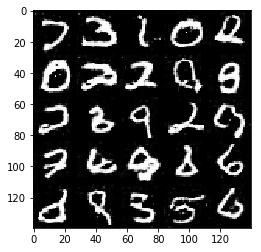

Epoch 3/5... Discriminator Loss: 1.4320... Generator Loss: 0.4501
Epoch 3/5... Discriminator Loss: 1.1918... Generator Loss: 0.5363
Epoch 3/5... Discriminator Loss: 0.4543... Generator Loss: 1.4604
Epoch 3/5... Discriminator Loss: 1.3572... Generator Loss: 0.4836
Epoch 3/5... Discriminator Loss: 0.4985... Generator Loss: 1.3348


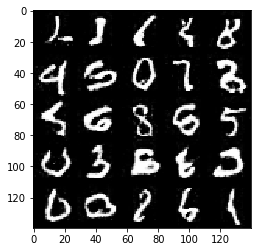

Epoch 3/5... Discriminator Loss: 0.3194... Generator Loss: 1.9717
Epoch 3/5... Discriminator Loss: 1.0420... Generator Loss: 0.6307
Epoch 3/5... Discriminator Loss: 1.7430... Generator Loss: 0.4395
Epoch 3/5... Discriminator Loss: 0.6110... Generator Loss: 1.1439
Epoch 3/5... Discriminator Loss: 0.5608... Generator Loss: 1.2983


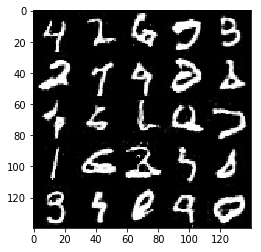

Epoch 3/5... Discriminator Loss: 0.5087... Generator Loss: 1.2994
Epoch 3/5... Discriminator Loss: 0.5126... Generator Loss: 1.5118
Epoch 3/5... Discriminator Loss: 0.4931... Generator Loss: 1.1198
Epoch 3/5... Discriminator Loss: 0.1412... Generator Loss: 5.7171
Epoch 3/5... Discriminator Loss: 2.3450... Generator Loss: 0.2537


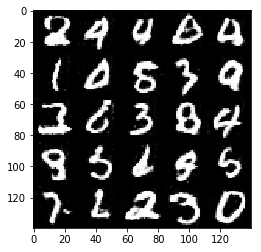

Epoch 3/5... Discriminator Loss: 0.1817... Generator Loss: 1.9920
Epoch 3/5... Discriminator Loss: 0.9176... Generator Loss: 0.7623
Epoch 3/5... Discriminator Loss: 0.4829... Generator Loss: 1.9533
Epoch 3/5... Discriminator Loss: 1.8695... Generator Loss: 0.2597
Epoch 3/5... Discriminator Loss: 0.8460... Generator Loss: 0.8210


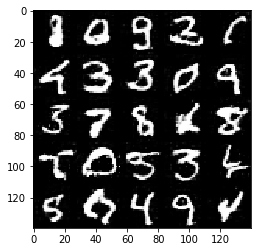

Epoch 4/5... Discriminator Loss: 0.8012... Generator Loss: 0.9228
Epoch 4/5... Discriminator Loss: 0.9222... Generator Loss: 0.6820
Epoch 4/5... Discriminator Loss: 0.4621... Generator Loss: 1.3995
Epoch 4/5... Discriminator Loss: 0.3676... Generator Loss: 2.3776
Epoch 4/5... Discriminator Loss: 1.0763... Generator Loss: 0.6659


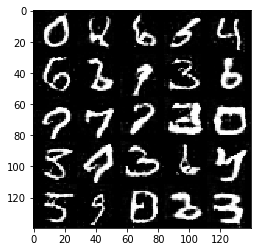

Epoch 4/5... Discriminator Loss: 0.5696... Generator Loss: 1.2241
Epoch 4/5... Discriminator Loss: 0.3890... Generator Loss: 1.7204
Epoch 4/5... Discriminator Loss: 0.8099... Generator Loss: 0.9102
Epoch 4/5... Discriminator Loss: 0.4485... Generator Loss: 1.6144
Epoch 4/5... Discriminator Loss: 1.4268... Generator Loss: 0.3968


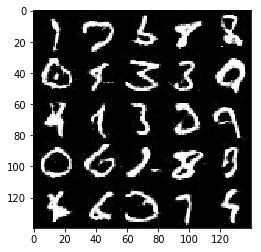

Epoch 4/5... Discriminator Loss: 1.4783... Generator Loss: 0.5066
Epoch 4/5... Discriminator Loss: 0.7092... Generator Loss: 1.0747
Epoch 4/5... Discriminator Loss: 0.2890... Generator Loss: 2.0321
Epoch 4/5... Discriminator Loss: 1.0592... Generator Loss: 0.6148
Epoch 4/5... Discriminator Loss: 0.7590... Generator Loss: 0.8480


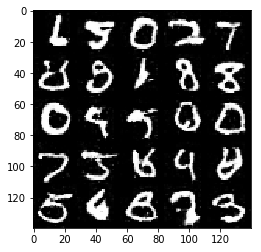

Epoch 4/5... Discriminator Loss: 1.0072... Generator Loss: 0.6601
Epoch 4/5... Discriminator Loss: 1.1986... Generator Loss: 0.6492
Epoch 4/5... Discriminator Loss: 0.3934... Generator Loss: 1.6792
Epoch 4/5... Discriminator Loss: 0.7890... Generator Loss: 1.1523
Epoch 4/5... Discriminator Loss: 0.4164... Generator Loss: 1.8669


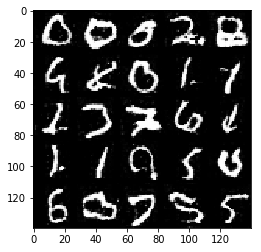

Epoch 4/5... Discriminator Loss: 0.6352... Generator Loss: 1.4510
Epoch 4/5... Discriminator Loss: 0.7191... Generator Loss: 1.0861
Epoch 4/5... Discriminator Loss: 1.1351... Generator Loss: 0.5418
Epoch 4/5... Discriminator Loss: 1.1128... Generator Loss: 0.8487
Epoch 4/5... Discriminator Loss: 0.4340... Generator Loss: 1.7764


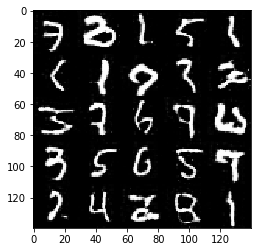

Epoch 4/5... Discriminator Loss: 0.2787... Generator Loss: 1.8231
Epoch 4/5... Discriminator Loss: 0.8836... Generator Loss: 1.3068
Epoch 4/5... Discriminator Loss: 0.6289... Generator Loss: 1.1708
Epoch 4/5... Discriminator Loss: 1.4027... Generator Loss: 0.3785
Epoch 4/5... Discriminator Loss: 1.5697... Generator Loss: 0.3860


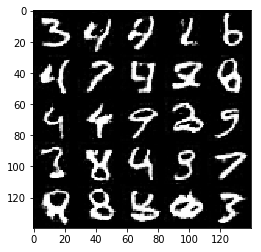

Epoch 4/5... Discriminator Loss: 0.4742... Generator Loss: 1.4290
Epoch 4/5... Discriminator Loss: 1.2560... Generator Loss: 0.5116
Epoch 4/5... Discriminator Loss: 1.1296... Generator Loss: 0.5320
Epoch 4/5... Discriminator Loss: 0.2888... Generator Loss: 1.7454
Epoch 4/5... Discriminator Loss: 1.6598... Generator Loss: 0.5277


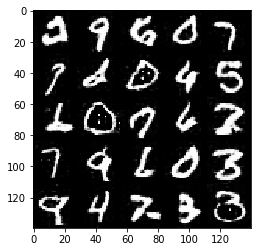

Epoch 4/5... Discriminator Loss: 0.7892... Generator Loss: 0.9930
Epoch 4/5... Discriminator Loss: 0.9890... Generator Loss: 0.8187
Epoch 4/5... Discriminator Loss: 1.2668... Generator Loss: 0.8051
Epoch 4/5... Discriminator Loss: 0.7593... Generator Loss: 0.8573
Epoch 4/5... Discriminator Loss: 0.6336... Generator Loss: 0.9000


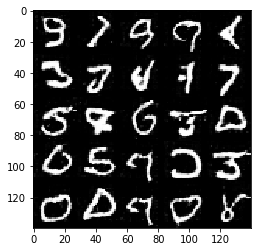

Epoch 4/5... Discriminator Loss: 0.9996... Generator Loss: 0.6588
Epoch 4/5... Discriminator Loss: 0.2954... Generator Loss: 2.0883
Epoch 4/5... Discriminator Loss: 2.3362... Generator Loss: 0.4548
Epoch 4/5... Discriminator Loss: 1.7354... Generator Loss: 0.6097
Epoch 4/5... Discriminator Loss: 0.2173... Generator Loss: 2.2939


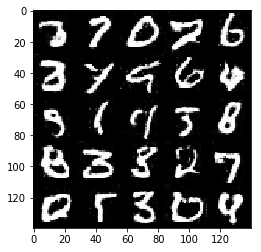

Epoch 4/5... Discriminator Loss: 0.4987... Generator Loss: 1.3226
Epoch 4/5... Discriminator Loss: 1.5988... Generator Loss: 0.3617
Epoch 4/5... Discriminator Loss: 1.2492... Generator Loss: 0.6772
Epoch 4/5... Discriminator Loss: 0.4428... Generator Loss: 1.4102
Epoch 4/5... Discriminator Loss: 0.4934... Generator Loss: 1.5384


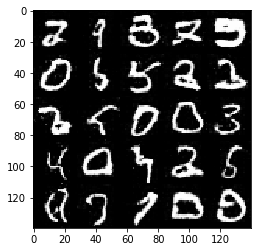

Epoch 4/5... Discriminator Loss: 0.5158... Generator Loss: 1.2389
Epoch 4/5... Discriminator Loss: 0.6058... Generator Loss: 1.2262
Epoch 4/5... Discriminator Loss: 0.2613... Generator Loss: 6.2087
Epoch 4/5... Discriminator Loss: 0.6409... Generator Loss: 1.0497
Epoch 4/5... Discriminator Loss: 0.6077... Generator Loss: 1.1615


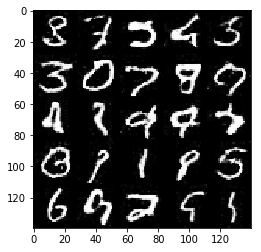

Epoch 4/5... Discriminator Loss: 1.0224... Generator Loss: 0.6337
Epoch 4/5... Discriminator Loss: 1.7504... Generator Loss: 0.5028
Epoch 4/5... Discriminator Loss: 0.8496... Generator Loss: 1.0735
Epoch 4/5... Discriminator Loss: 1.3815... Generator Loss: 0.4915
Epoch 4/5... Discriminator Loss: 0.3846... Generator Loss: 1.4047


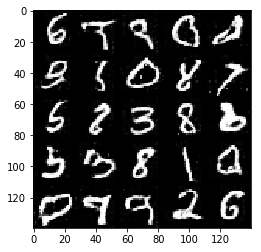

Epoch 4/5... Discriminator Loss: 1.6543... Generator Loss: 0.3698
Epoch 4/5... Discriminator Loss: 1.2560... Generator Loss: 0.4945
Epoch 4/5... Discriminator Loss: 1.5575... Generator Loss: 0.4111
Epoch 4/5... Discriminator Loss: 1.6603... Generator Loss: 0.3177
Epoch 4/5... Discriminator Loss: 0.8103... Generator Loss: 0.7473


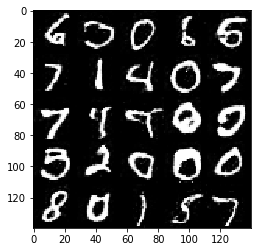

Epoch 4/5... Discriminator Loss: 0.7453... Generator Loss: 0.8499
Epoch 4/5... Discriminator Loss: 0.2378... Generator Loss: 1.9360
Epoch 4/5... Discriminator Loss: 0.9451... Generator Loss: 0.7127
Epoch 4/5... Discriminator Loss: 0.3792... Generator Loss: 1.6368
Epoch 4/5... Discriminator Loss: 1.4487... Generator Loss: 0.7929


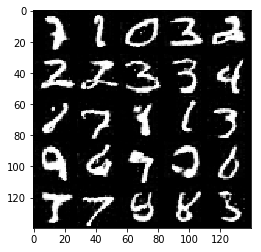

Epoch 4/5... Discriminator Loss: 0.5528... Generator Loss: 1.2115
Epoch 4/5... Discriminator Loss: 0.9836... Generator Loss: 0.5845
Epoch 4/5... Discriminator Loss: 0.9434... Generator Loss: 4.1861
Epoch 4/5... Discriminator Loss: 1.9309... Generator Loss: 0.3763
Epoch 4/5... Discriminator Loss: 0.2496... Generator Loss: 2.0981


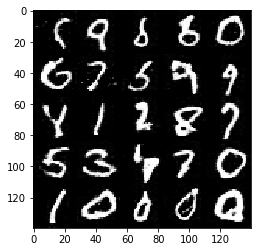

Epoch 5/5... Discriminator Loss: 0.2390... Generator Loss: 2.3351
Epoch 5/5... Discriminator Loss: 0.5698... Generator Loss: 1.0207
Epoch 5/5... Discriminator Loss: 1.1268... Generator Loss: 0.5562
Epoch 5/5... Discriminator Loss: 0.6787... Generator Loss: 1.5416
Epoch 5/5... Discriminator Loss: 2.9857... Generator Loss: 0.1061


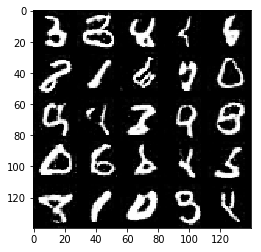

Epoch 5/5... Discriminator Loss: 1.0530... Generator Loss: 0.7602
Epoch 5/5... Discriminator Loss: 0.5531... Generator Loss: 1.1499
Epoch 5/5... Discriminator Loss: 1.1352... Generator Loss: 0.5662
Epoch 5/5... Discriminator Loss: 0.7181... Generator Loss: 0.9078
Epoch 5/5... Discriminator Loss: 0.4153... Generator Loss: 1.6823


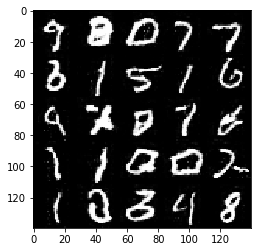

Epoch 5/5... Discriminator Loss: 1.9020... Generator Loss: 0.3424
Epoch 5/5... Discriminator Loss: 0.5589... Generator Loss: 1.0484
Epoch 5/5... Discriminator Loss: 0.5563... Generator Loss: 1.3124
Epoch 5/5... Discriminator Loss: 0.4039... Generator Loss: 1.3789
Epoch 5/5... Discriminator Loss: 0.5824... Generator Loss: 1.2168


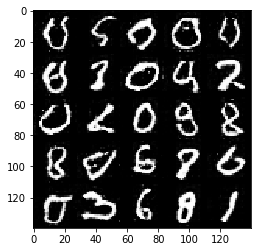

Epoch 5/5... Discriminator Loss: 0.7636... Generator Loss: 1.0149
Epoch 5/5... Discriminator Loss: 0.3422... Generator Loss: 1.9038
Epoch 5/5... Discriminator Loss: 1.0291... Generator Loss: 1.0495
Epoch 5/5... Discriminator Loss: 0.2918... Generator Loss: 2.4131
Epoch 5/5... Discriminator Loss: 1.1408... Generator Loss: 0.6789


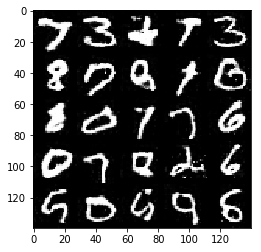

Epoch 5/5... Discriminator Loss: 1.4452... Generator Loss: 7.9150
Epoch 5/5... Discriminator Loss: 1.2508... Generator Loss: 0.6575
Epoch 5/5... Discriminator Loss: 1.6145... Generator Loss: 0.3819
Epoch 5/5... Discriminator Loss: 0.6280... Generator Loss: 1.0837
Epoch 5/5... Discriminator Loss: 0.2665... Generator Loss: 2.3322


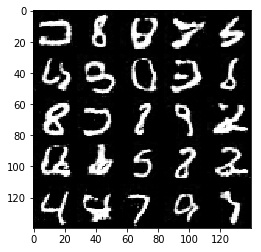

Epoch 5/5... Discriminator Loss: 0.5655... Generator Loss: 1.2583
Epoch 5/5... Discriminator Loss: 0.3978... Generator Loss: 1.5510
Epoch 5/5... Discriminator Loss: 0.2847... Generator Loss: 2.2740
Epoch 5/5... Discriminator Loss: 1.1506... Generator Loss: 0.6462
Epoch 5/5... Discriminator Loss: 0.7650... Generator Loss: 5.0474


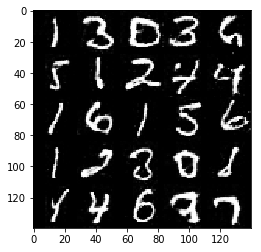

Epoch 5/5... Discriminator Loss: 0.7370... Generator Loss: 1.1022
Epoch 5/5... Discriminator Loss: 0.3215... Generator Loss: 2.2464
Epoch 5/5... Discriminator Loss: 2.1961... Generator Loss: 0.1950
Epoch 5/5... Discriminator Loss: 1.1830... Generator Loss: 0.5953
Epoch 5/5... Discriminator Loss: 1.9806... Generator Loss: 0.2465


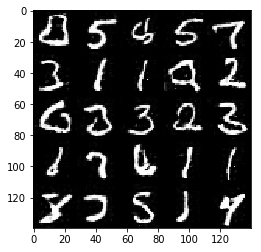

Epoch 5/5... Discriminator Loss: 0.1539... Generator Loss: 5.5635
Epoch 5/5... Discriminator Loss: 0.5894... Generator Loss: 1.6366
Epoch 5/5... Discriminator Loss: 0.3980... Generator Loss: 1.6010
Epoch 5/5... Discriminator Loss: 0.3056... Generator Loss: 1.6309
Epoch 5/5... Discriminator Loss: 0.8050... Generator Loss: 0.7719


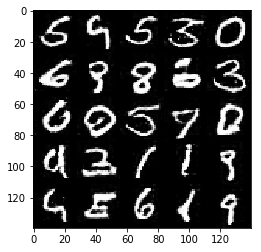

Epoch 5/5... Discriminator Loss: 0.6936... Generator Loss: 1.2390
Epoch 5/5... Discriminator Loss: 0.5395... Generator Loss: 1.3616
Epoch 5/5... Discriminator Loss: 0.4762... Generator Loss: 1.6412
Epoch 5/5... Discriminator Loss: 1.7649... Generator Loss: 0.5697
Epoch 5/5... Discriminator Loss: 0.4306... Generator Loss: 1.6966


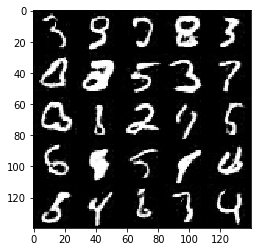

Epoch 5/5... Discriminator Loss: 1.4702... Generator Loss: 0.7943
Epoch 5/5... Discriminator Loss: 1.1941... Generator Loss: 0.7683
Epoch 5/5... Discriminator Loss: 0.6533... Generator Loss: 1.1802
Epoch 5/5... Discriminator Loss: 0.7768... Generator Loss: 1.0618
Epoch 5/5... Discriminator Loss: 0.7976... Generator Loss: 0.9326


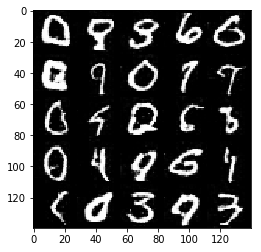

Epoch 5/5... Discriminator Loss: 1.6370... Generator Loss: 0.3341
Epoch 5/5... Discriminator Loss: 0.4316... Generator Loss: 1.5779
Epoch 5/5... Discriminator Loss: 0.1948... Generator Loss: 2.2631
Epoch 5/5... Discriminator Loss: 0.7552... Generator Loss: 1.0726
Epoch 5/5... Discriminator Loss: 0.7041... Generator Loss: 1.1967


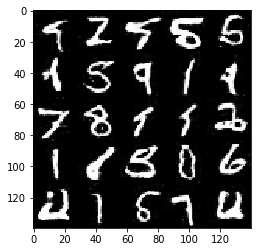

Epoch 5/5... Discriminator Loss: 1.4962... Generator Loss: 0.4539
Epoch 5/5... Discriminator Loss: 2.2648... Generator Loss: 0.3667
Epoch 5/5... Discriminator Loss: 0.3050... Generator Loss: 2.2593
Epoch 5/5... Discriminator Loss: 0.4681... Generator Loss: 1.5255
Epoch 5/5... Discriminator Loss: 1.5219... Generator Loss: 0.5779


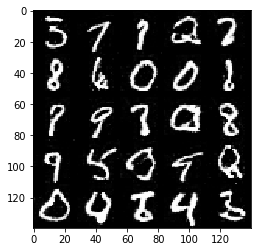

Epoch 5/5... Discriminator Loss: 1.0322... Generator Loss: 0.8084
Epoch 5/5... Discriminator Loss: 2.3870... Generator Loss: 0.4155
Epoch 5/5... Discriminator Loss: 1.5640... Generator Loss: 0.4673
Epoch 5/5... Discriminator Loss: 0.2171... Generator Loss: 2.8630
Epoch 5/5... Discriminator Loss: 0.4091... Generator Loss: 1.5321


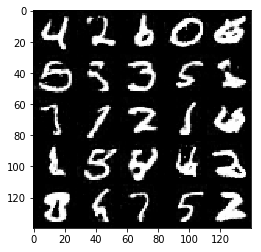

Epoch 5/5... Discriminator Loss: 0.4948... Generator Loss: 1.7934
Epoch 5/5... Discriminator Loss: 1.6105... Generator Loss: 0.7452
Epoch 5/5... Discriminator Loss: 0.8359... Generator Loss: 0.6665
Epoch 5/5... Discriminator Loss: 0.2088... Generator Loss: 2.3736
Epoch 5/5... Discriminator Loss: 0.5591... Generator Loss: 1.4639


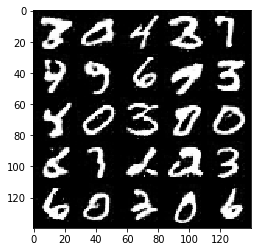

Epoch 5/5... Discriminator Loss: 0.5032... Generator Loss: 1.2013
Epoch 5/5... Discriminator Loss: 1.1635... Generator Loss: 0.6193
Epoch 5/5... Discriminator Loss: 0.4798... Generator Loss: 1.5169
Epoch 5/5... Discriminator Loss: 1.4635... Generator Loss: 0.5168
Epoch 5/5... Discriminator Loss: 0.6900... Generator Loss: 1.2521


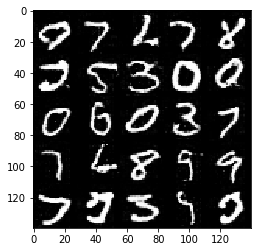

In [18]:
batch_size = 16
z_dim = 112
learning_rate = 0.00045
beta1 = 0.3

"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 5

mnist_dataset = helper.Dataset('mnist', glob(os.path.join(data_dir, 'mnist/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, mnist_dataset.get_batches,
          mnist_dataset.shape, mnist_dataset.image_mode)

### CelebA
Run your GANs on CelebA.  It will take around 20 minutes on the average GPU to run one epoch.  You can run the whole epoch or stop when it starts to generate realistic faces.

(202599, 28, 28, 3)
width: 28, height: 28, channels: 3
Channel mode: RGB
Epoch 1/2... Discriminator Loss: 0.6263... Generator Loss: 0.9208
Epoch 1/2... Discriminator Loss: 0.6502... Generator Loss: 3.9704
Epoch 1/2... Discriminator Loss: 0.3629... Generator Loss: 3.1411
Epoch 1/2... Discriminator Loss: 1.1793... Generator Loss: 0.6624
Epoch 1/2... Discriminator Loss: 1.4490... Generator Loss: 0.5647


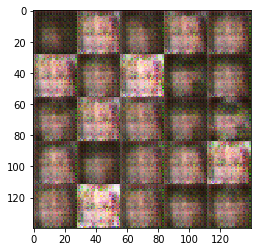

Epoch 1/2... Discriminator Loss: 1.5301... Generator Loss: 0.5149
Epoch 1/2... Discriminator Loss: 0.9182... Generator Loss: 1.0288
Epoch 1/2... Discriminator Loss: 1.0998... Generator Loss: 0.8182
Epoch 1/2... Discriminator Loss: 2.3403... Generator Loss: 0.2406
Epoch 1/2... Discriminator Loss: 1.2062... Generator Loss: 0.4959


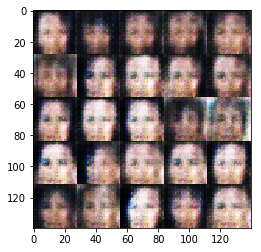

Epoch 1/2... Discriminator Loss: 0.7884... Generator Loss: 1.1840
Epoch 1/2... Discriminator Loss: 1.0022... Generator Loss: 1.4590
Epoch 1/2... Discriminator Loss: 0.8068... Generator Loss: 1.5511
Epoch 1/2... Discriminator Loss: 1.5717... Generator Loss: 0.3573
Epoch 1/2... Discriminator Loss: 1.8697... Generator Loss: 0.2799


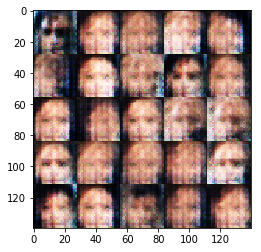

Epoch 1/2... Discriminator Loss: 0.7793... Generator Loss: 1.1788
Epoch 1/2... Discriminator Loss: 1.3698... Generator Loss: 0.5184
Epoch 1/2... Discriminator Loss: 0.6154... Generator Loss: 1.4457
Epoch 1/2... Discriminator Loss: 0.9647... Generator Loss: 0.9074
Epoch 1/2... Discriminator Loss: 1.0844... Generator Loss: 1.0791


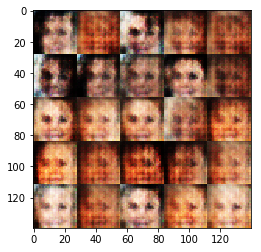

Epoch 1/2... Discriminator Loss: 1.8534... Generator Loss: 0.2363
Epoch 1/2... Discriminator Loss: 1.0470... Generator Loss: 1.2995
Epoch 1/2... Discriminator Loss: 0.6708... Generator Loss: 1.3346
Epoch 1/2... Discriminator Loss: 0.5618... Generator Loss: 1.2223
Epoch 1/2... Discriminator Loss: 1.1241... Generator Loss: 0.8906


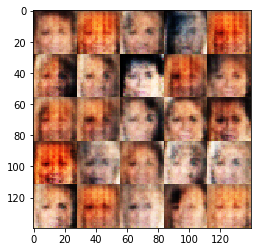

Epoch 1/2... Discriminator Loss: 1.0024... Generator Loss: 0.8012
Epoch 1/2... Discriminator Loss: 1.4363... Generator Loss: 0.6561
Epoch 1/2... Discriminator Loss: 0.6675... Generator Loss: 1.8961
Epoch 1/2... Discriminator Loss: 1.4127... Generator Loss: 0.4051
Epoch 1/2... Discriminator Loss: 1.0638... Generator Loss: 0.7699


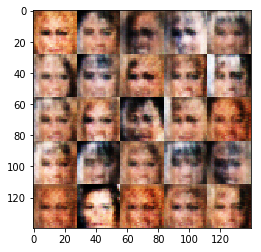

Epoch 1/2... Discriminator Loss: 0.9174... Generator Loss: 1.2867
Epoch 1/2... Discriminator Loss: 1.4276... Generator Loss: 2.5133
Epoch 1/2... Discriminator Loss: 0.9901... Generator Loss: 0.9015
Epoch 1/2... Discriminator Loss: 0.6294... Generator Loss: 1.5032
Epoch 1/2... Discriminator Loss: 1.2990... Generator Loss: 0.5593


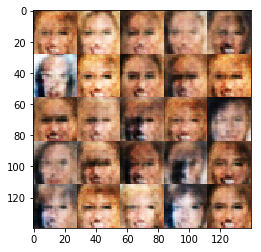

Epoch 1/2... Discriminator Loss: 0.9553... Generator Loss: 0.9541
Epoch 1/2... Discriminator Loss: 0.9541... Generator Loss: 1.1716
Epoch 1/2... Discriminator Loss: 0.7316... Generator Loss: 1.5085
Epoch 1/2... Discriminator Loss: 0.7699... Generator Loss: 1.2953
Epoch 1/2... Discriminator Loss: 0.9723... Generator Loss: 1.1995


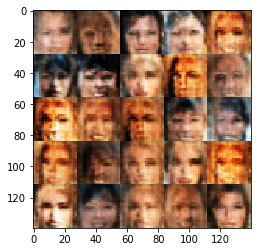

Epoch 1/2... Discriminator Loss: 1.5505... Generator Loss: 0.4276
Epoch 1/2... Discriminator Loss: 1.4784... Generator Loss: 0.4449
Epoch 1/2... Discriminator Loss: 1.2842... Generator Loss: 0.4963
Epoch 1/2... Discriminator Loss: 0.7434... Generator Loss: 1.1106
Epoch 1/2... Discriminator Loss: 1.3095... Generator Loss: 0.6001


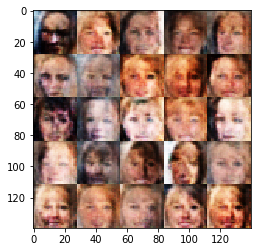

Epoch 1/2... Discriminator Loss: 1.4993... Generator Loss: 0.3948
Epoch 1/2... Discriminator Loss: 1.5139... Generator Loss: 1.7546
Epoch 1/2... Discriminator Loss: 1.4821... Generator Loss: 0.5510
Epoch 1/2... Discriminator Loss: 1.2481... Generator Loss: 0.5266
Epoch 1/2... Discriminator Loss: 0.7151... Generator Loss: 1.2799


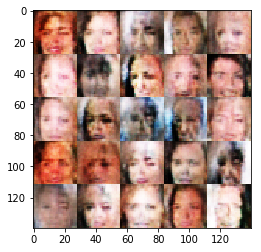

Epoch 1/2... Discriminator Loss: 1.1062... Generator Loss: 1.0521
Epoch 1/2... Discriminator Loss: 0.9784... Generator Loss: 0.8151
Epoch 1/2... Discriminator Loss: 1.3725... Generator Loss: 1.2314
Epoch 1/2... Discriminator Loss: 1.5006... Generator Loss: 0.4411
Epoch 1/2... Discriminator Loss: 1.5266... Generator Loss: 0.3343


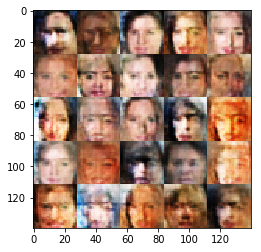

Epoch 1/2... Discriminator Loss: 1.0681... Generator Loss: 0.7289
Epoch 1/2... Discriminator Loss: 1.0634... Generator Loss: 0.8447
Epoch 1/2... Discriminator Loss: 1.2983... Generator Loss: 0.5628
Epoch 1/2... Discriminator Loss: 0.8371... Generator Loss: 1.3286
Epoch 1/2... Discriminator Loss: 1.0344... Generator Loss: 0.8609


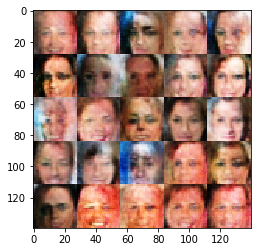

Epoch 1/2... Discriminator Loss: 1.6049... Generator Loss: 0.3745
Epoch 1/2... Discriminator Loss: 1.5425... Generator Loss: 0.3835
Epoch 1/2... Discriminator Loss: 1.1348... Generator Loss: 0.8403
Epoch 1/2... Discriminator Loss: 1.3292... Generator Loss: 0.5378
Epoch 1/2... Discriminator Loss: 1.0211... Generator Loss: 1.8031


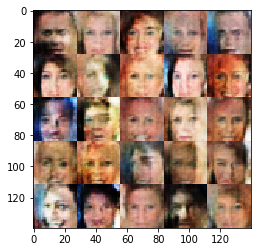

Epoch 1/2... Discriminator Loss: 1.2023... Generator Loss: 0.5902
Epoch 1/2... Discriminator Loss: 1.1383... Generator Loss: 0.7964
Epoch 1/2... Discriminator Loss: 1.7100... Generator Loss: 0.3622
Epoch 1/2... Discriminator Loss: 1.2808... Generator Loss: 0.9340
Epoch 1/2... Discriminator Loss: 1.1676... Generator Loss: 0.5590


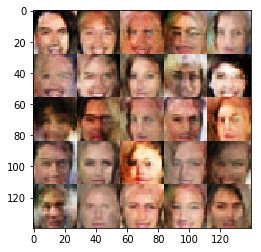

Epoch 1/2... Discriminator Loss: 1.3327... Generator Loss: 0.5260
Epoch 1/2... Discriminator Loss: 1.0827... Generator Loss: 0.8117
Epoch 1/2... Discriminator Loss: 1.3048... Generator Loss: 0.4407
Epoch 1/2... Discriminator Loss: 1.1866... Generator Loss: 0.7700
Epoch 1/2... Discriminator Loss: 1.2224... Generator Loss: 0.5067


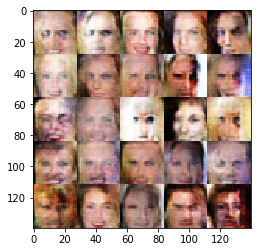

Epoch 1/2... Discriminator Loss: 1.6965... Generator Loss: 0.2799
Epoch 1/2... Discriminator Loss: 0.9795... Generator Loss: 0.9477
Epoch 1/2... Discriminator Loss: 1.4363... Generator Loss: 0.4202
Epoch 1/2... Discriminator Loss: 1.5106... Generator Loss: 0.3417
Epoch 1/2... Discriminator Loss: 0.9382... Generator Loss: 0.7598


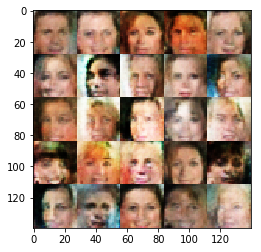

Epoch 1/2... Discriminator Loss: 1.5390... Generator Loss: 0.3353
Epoch 1/2... Discriminator Loss: 1.2429... Generator Loss: 0.6500
Epoch 1/2... Discriminator Loss: 1.1819... Generator Loss: 0.5547
Epoch 1/2... Discriminator Loss: 0.9877... Generator Loss: 1.1363
Epoch 1/2... Discriminator Loss: 1.7163... Generator Loss: 0.2288


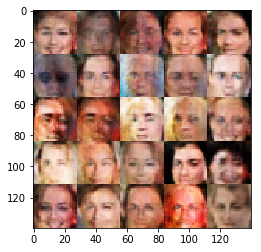

Epoch 1/2... Discriminator Loss: 1.2786... Generator Loss: 0.7999
Epoch 1/2... Discriminator Loss: 0.7888... Generator Loss: 1.0779
Epoch 1/2... Discriminator Loss: 0.9217... Generator Loss: 1.1157
Epoch 1/2... Discriminator Loss: 1.0828... Generator Loss: 0.7283
Epoch 1/2... Discriminator Loss: 1.1846... Generator Loss: 0.6304


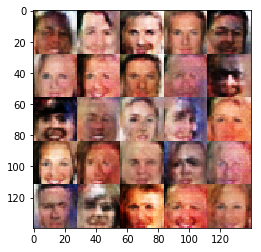

Epoch 1/2... Discriminator Loss: 0.9873... Generator Loss: 1.1320
Epoch 1/2... Discriminator Loss: 1.5169... Generator Loss: 1.3243
Epoch 1/2... Discriminator Loss: 0.7906... Generator Loss: 1.0431
Epoch 1/2... Discriminator Loss: 0.8724... Generator Loss: 1.0319
Epoch 1/2... Discriminator Loss: 0.5310... Generator Loss: 1.3547


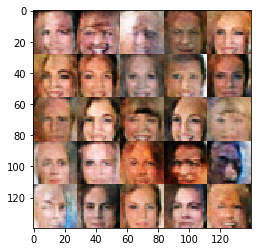

Epoch 1/2... Discriminator Loss: 1.0289... Generator Loss: 0.6108
Epoch 1/2... Discriminator Loss: 0.5388... Generator Loss: 1.8295
Epoch 1/2... Discriminator Loss: 1.4358... Generator Loss: 0.4890
Epoch 1/2... Discriminator Loss: 1.2411... Generator Loss: 0.5135
Epoch 1/2... Discriminator Loss: 0.9711... Generator Loss: 1.0973


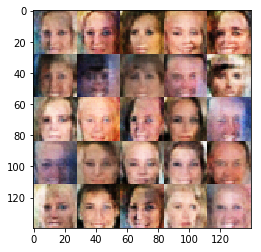

Epoch 1/2... Discriminator Loss: 1.6480... Generator Loss: 0.9195
Epoch 1/2... Discriminator Loss: 1.1958... Generator Loss: 0.5071
Epoch 1/2... Discriminator Loss: 0.8485... Generator Loss: 1.1011
Epoch 1/2... Discriminator Loss: 1.8008... Generator Loss: 0.2451
Epoch 1/2... Discriminator Loss: 1.5664... Generator Loss: 0.7709


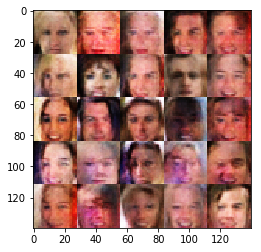

Epoch 1/2... Discriminator Loss: 1.2002... Generator Loss: 0.5495
Epoch 1/2... Discriminator Loss: 0.6408... Generator Loss: 1.1816
Epoch 1/2... Discriminator Loss: 0.8857... Generator Loss: 0.9519
Epoch 1/2... Discriminator Loss: 1.5583... Generator Loss: 0.3277
Epoch 1/2... Discriminator Loss: 0.8978... Generator Loss: 0.7470


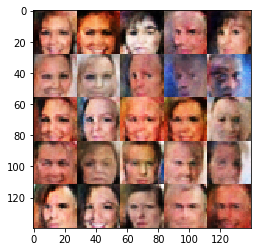

Epoch 1/2... Discriminator Loss: 1.0333... Generator Loss: 0.9175
Epoch 1/2... Discriminator Loss: 0.9922... Generator Loss: 0.8911
Epoch 1/2... Discriminator Loss: 1.3142... Generator Loss: 0.4227
Epoch 1/2... Discriminator Loss: 1.4229... Generator Loss: 0.3488
Epoch 1/2... Discriminator Loss: 1.2551... Generator Loss: 0.5456


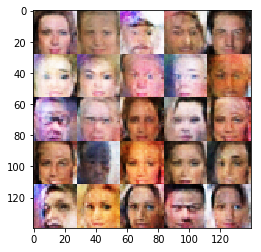

Epoch 1/2... Discriminator Loss: 1.1118... Generator Loss: 1.0847
Epoch 1/2... Discriminator Loss: 0.8035... Generator Loss: 1.4303
Epoch 1/2... Discriminator Loss: 1.3433... Generator Loss: 0.4223
Epoch 1/2... Discriminator Loss: 1.8594... Generator Loss: 0.2590
Epoch 1/2... Discriminator Loss: 1.0373... Generator Loss: 0.6875


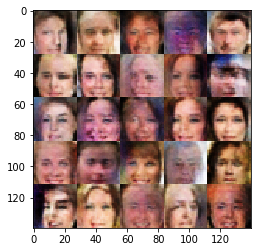

Epoch 1/2... Discriminator Loss: 1.2484... Generator Loss: 0.7777
Epoch 1/2... Discriminator Loss: 0.5409... Generator Loss: 1.6174
Epoch 1/2... Discriminator Loss: 0.8168... Generator Loss: 1.1151
Epoch 1/2... Discriminator Loss: 1.0643... Generator Loss: 0.9789
Epoch 1/2... Discriminator Loss: 0.8224... Generator Loss: 1.0517


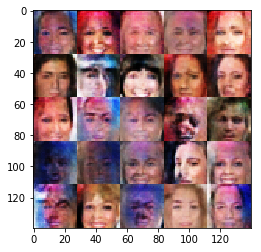

Epoch 1/2... Discriminator Loss: 0.7757... Generator Loss: 1.4755
Epoch 1/2... Discriminator Loss: 0.9431... Generator Loss: 0.9932
Epoch 1/2... Discriminator Loss: 1.1694... Generator Loss: 0.5381
Epoch 1/2... Discriminator Loss: 1.0405... Generator Loss: 0.8930
Epoch 1/2... Discriminator Loss: 1.0288... Generator Loss: 0.7105


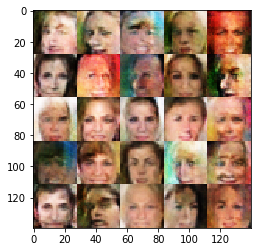

Epoch 1/2... Discriminator Loss: 0.9816... Generator Loss: 1.0634
Epoch 1/2... Discriminator Loss: 0.9881... Generator Loss: 0.7288
Epoch 1/2... Discriminator Loss: 0.6723... Generator Loss: 1.2408
Epoch 1/2... Discriminator Loss: 1.5518... Generator Loss: 1.6143
Epoch 1/2... Discriminator Loss: 0.4958... Generator Loss: 1.3709


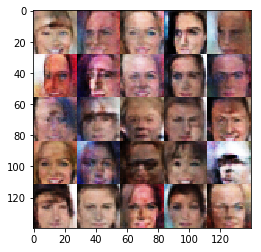

Epoch 1/2... Discriminator Loss: 1.2112... Generator Loss: 0.6650
Epoch 1/2... Discriminator Loss: 1.0543... Generator Loss: 1.2232
Epoch 1/2... Discriminator Loss: 1.0067... Generator Loss: 1.0829
Epoch 1/2... Discriminator Loss: 1.0516... Generator Loss: 0.7077
Epoch 1/2... Discriminator Loss: 0.9792... Generator Loss: 1.5485


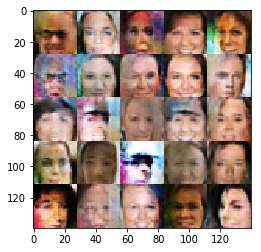

Epoch 1/2... Discriminator Loss: 0.6320... Generator Loss: 1.4688
Epoch 1/2... Discriminator Loss: 1.6724... Generator Loss: 0.2804
Epoch 1/2... Discriminator Loss: 0.8999... Generator Loss: 0.6997
Epoch 1/2... Discriminator Loss: 1.2302... Generator Loss: 0.4716
Epoch 1/2... Discriminator Loss: 1.0435... Generator Loss: 0.7456


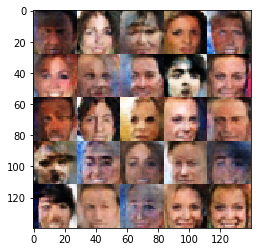

Epoch 1/2... Discriminator Loss: 1.7795... Generator Loss: 0.2420
Epoch 1/2... Discriminator Loss: 0.8467... Generator Loss: 0.8055
Epoch 1/2... Discriminator Loss: 0.6025... Generator Loss: 1.2992
Epoch 1/2... Discriminator Loss: 0.9108... Generator Loss: 0.8603
Epoch 1/2... Discriminator Loss: 1.4787... Generator Loss: 0.3321


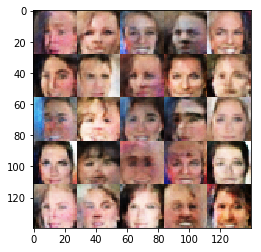

Epoch 1/2... Discriminator Loss: 1.7680... Generator Loss: 0.2516
Epoch 1/2... Discriminator Loss: 0.8192... Generator Loss: 1.4684
Epoch 1/2... Discriminator Loss: 0.8282... Generator Loss: 1.0505
Epoch 1/2... Discriminator Loss: 1.0359... Generator Loss: 0.5860
Epoch 1/2... Discriminator Loss: 0.9807... Generator Loss: 0.7183


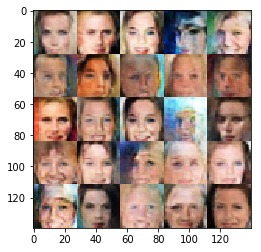

Epoch 1/2... Discriminator Loss: 2.3754... Generator Loss: 0.1110
Epoch 1/2... Discriminator Loss: 1.7023... Generator Loss: 0.2766
Epoch 1/2... Discriminator Loss: 0.7047... Generator Loss: 0.9510
Epoch 1/2... Discriminator Loss: 1.3894... Generator Loss: 0.3520
Epoch 1/2... Discriminator Loss: 0.7620... Generator Loss: 1.4919


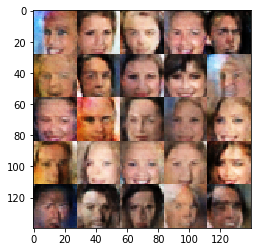

Epoch 1/2... Discriminator Loss: 1.4323... Generator Loss: 0.3445
Epoch 1/2... Discriminator Loss: 0.7986... Generator Loss: 1.1568
Epoch 1/2... Discriminator Loss: 1.0618... Generator Loss: 0.5871
Epoch 1/2... Discriminator Loss: 0.8165... Generator Loss: 1.3010
Epoch 1/2... Discriminator Loss: 1.3313... Generator Loss: 1.0026


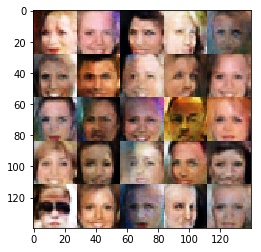

Epoch 1/2... Discriminator Loss: 0.9478... Generator Loss: 0.6494
Epoch 1/2... Discriminator Loss: 0.7674... Generator Loss: 1.0939
Epoch 1/2... Discriminator Loss: 0.5554... Generator Loss: 1.5058
Epoch 1/2... Discriminator Loss: 1.3608... Generator Loss: 0.4176
Epoch 1/2... Discriminator Loss: 0.8222... Generator Loss: 0.8577


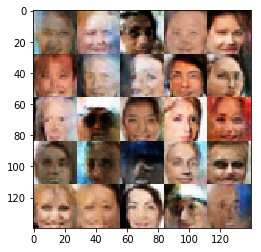

Epoch 1/2... Discriminator Loss: 0.9263... Generator Loss: 1.0550
Epoch 1/2... Discriminator Loss: 0.9044... Generator Loss: 2.3550
Epoch 1/2... Discriminator Loss: 1.6800... Generator Loss: 0.2749
Epoch 1/2... Discriminator Loss: 1.6494... Generator Loss: 0.3057
Epoch 1/2... Discriminator Loss: 1.0145... Generator Loss: 0.8069


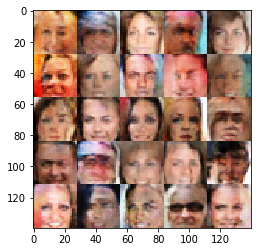

Epoch 1/2... Discriminator Loss: 1.0421... Generator Loss: 0.6063
Epoch 1/2... Discriminator Loss: 0.5529... Generator Loss: 1.5291
Epoch 1/2... Discriminator Loss: 1.2840... Generator Loss: 1.1991
Epoch 1/2... Discriminator Loss: 1.0132... Generator Loss: 1.0458
Epoch 1/2... Discriminator Loss: 1.8166... Generator Loss: 0.2093


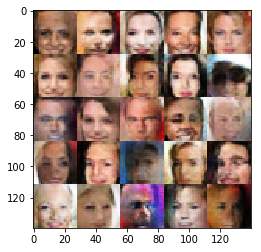

Epoch 1/2... Discriminator Loss: 1.1992... Generator Loss: 0.7359
Epoch 1/2... Discriminator Loss: 0.7518... Generator Loss: 1.1721
Epoch 1/2... Discriminator Loss: 1.1653... Generator Loss: 0.6043
Epoch 1/2... Discriminator Loss: 0.8195... Generator Loss: 0.7348
Epoch 1/2... Discriminator Loss: 1.1721... Generator Loss: 0.5055


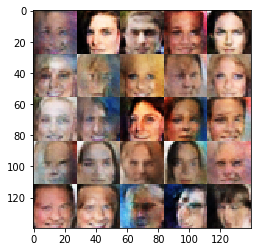

Epoch 1/2... Discriminator Loss: 0.6493... Generator Loss: 1.5514
Epoch 1/2... Discriminator Loss: 0.6621... Generator Loss: 1.8145
Epoch 1/2... Discriminator Loss: 1.1061... Generator Loss: 0.6210
Epoch 1/2... Discriminator Loss: 0.7597... Generator Loss: 1.2388
Epoch 1/2... Discriminator Loss: 1.6342... Generator Loss: 0.2368


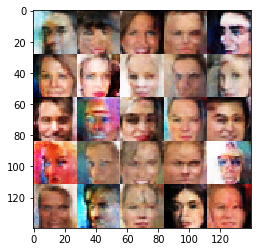

Epoch 1/2... Discriminator Loss: 1.0085... Generator Loss: 0.6134
Epoch 1/2... Discriminator Loss: 0.6011... Generator Loss: 1.2042
Epoch 1/2... Discriminator Loss: 0.9228... Generator Loss: 0.8936
Epoch 1/2... Discriminator Loss: 0.8618... Generator Loss: 0.7617
Epoch 1/2... Discriminator Loss: 0.8003... Generator Loss: 1.0256


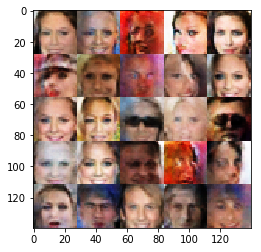

Epoch 1/2... Discriminator Loss: 1.4085... Generator Loss: 0.7818
Epoch 1/2... Discriminator Loss: 0.6441... Generator Loss: 1.0228
Epoch 1/2... Discriminator Loss: 1.1641... Generator Loss: 0.4761
Epoch 1/2... Discriminator Loss: 0.7104... Generator Loss: 0.8956
Epoch 1/2... Discriminator Loss: 1.1399... Generator Loss: 0.5010


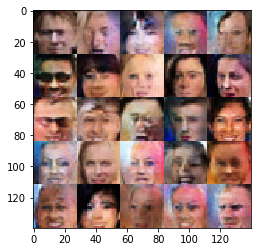

Epoch 1/2... Discriminator Loss: 0.6757... Generator Loss: 1.2385
Epoch 1/2... Discriminator Loss: 0.7485... Generator Loss: 0.9668
Epoch 1/2... Discriminator Loss: 2.0673... Generator Loss: 0.1625
Epoch 1/2... Discriminator Loss: 1.0206... Generator Loss: 0.6230
Epoch 1/2... Discriminator Loss: 0.9632... Generator Loss: 0.6902


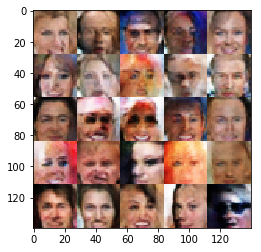

Epoch 1/2... Discriminator Loss: 1.3851... Generator Loss: 0.3483
Epoch 1/2... Discriminator Loss: 0.8988... Generator Loss: 0.8688
Epoch 1/2... Discriminator Loss: 0.9847... Generator Loss: 0.7149
Epoch 1/2... Discriminator Loss: 0.8397... Generator Loss: 0.9340
Epoch 1/2... Discriminator Loss: 0.7187... Generator Loss: 1.2146


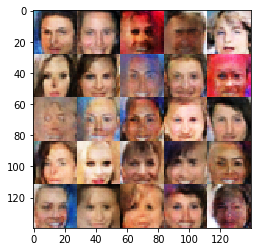

Epoch 1/2... Discriminator Loss: 0.6491... Generator Loss: 1.3245
Epoch 1/2... Discriminator Loss: 2.0152... Generator Loss: 0.1636
Epoch 1/2... Discriminator Loss: 0.8643... Generator Loss: 0.9863
Epoch 1/2... Discriminator Loss: 1.1601... Generator Loss: 0.6372
Epoch 1/2... Discriminator Loss: 1.0584... Generator Loss: 0.5997


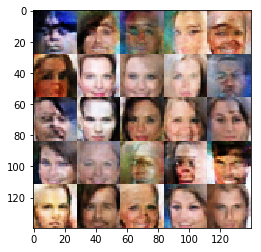

Epoch 1/2... Discriminator Loss: 0.9603... Generator Loss: 0.6574
Epoch 1/2... Discriminator Loss: 0.6705... Generator Loss: 1.0052
Epoch 1/2... Discriminator Loss: 0.8880... Generator Loss: 0.8584
Epoch 1/2... Discriminator Loss: 0.8557... Generator Loss: 1.0447
Epoch 1/2... Discriminator Loss: 1.0230... Generator Loss: 0.5568


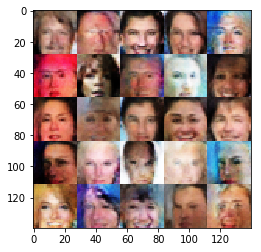

Epoch 1/2... Discriminator Loss: 2.5480... Generator Loss: 0.0938
Epoch 1/2... Discriminator Loss: 0.4425... Generator Loss: 1.5361
Epoch 1/2... Discriminator Loss: 2.0586... Generator Loss: 0.1851
Epoch 1/2... Discriminator Loss: 1.0172... Generator Loss: 0.5531
Epoch 1/2... Discriminator Loss: 0.8267... Generator Loss: 0.7827


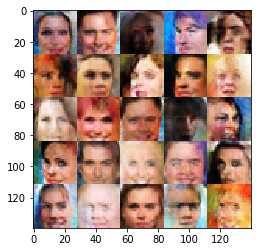

Epoch 1/2... Discriminator Loss: 0.9328... Generator Loss: 0.7098
Epoch 1/2... Discriminator Loss: 1.0350... Generator Loss: 0.5481
Epoch 1/2... Discriminator Loss: 0.4696... Generator Loss: 1.5797
Epoch 1/2... Discriminator Loss: 0.7596... Generator Loss: 0.9166
Epoch 1/2... Discriminator Loss: 0.7725... Generator Loss: 0.9736


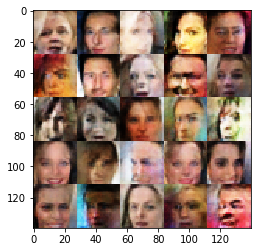

Epoch 1/2... Discriminator Loss: 0.5700... Generator Loss: 1.5610
Epoch 1/2... Discriminator Loss: 1.5322... Generator Loss: 1.5218
Epoch 1/2... Discriminator Loss: 1.0963... Generator Loss: 0.6389
Epoch 1/2... Discriminator Loss: 1.1968... Generator Loss: 0.5324
Epoch 1/2... Discriminator Loss: 0.6239... Generator Loss: 1.3207


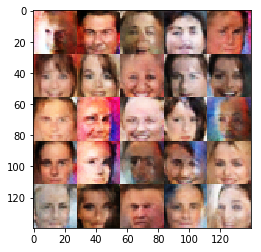

Epoch 1/2... Discriminator Loss: 1.2088... Generator Loss: 0.4757
Epoch 1/2... Discriminator Loss: 1.4195... Generator Loss: 0.3382
Epoch 1/2... Discriminator Loss: 0.9856... Generator Loss: 0.6518
Epoch 1/2... Discriminator Loss: 0.5959... Generator Loss: 1.1499
Epoch 1/2... Discriminator Loss: 1.1293... Generator Loss: 0.5385


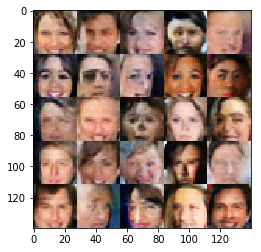

Epoch 1/2... Discriminator Loss: 2.2720... Generator Loss: 0.1359
Epoch 1/2... Discriminator Loss: 1.0349... Generator Loss: 0.6726
Epoch 1/2... Discriminator Loss: 1.1538... Generator Loss: 0.5090
Epoch 1/2... Discriminator Loss: 1.1356... Generator Loss: 2.2241
Epoch 1/2... Discriminator Loss: 0.6842... Generator Loss: 1.0280


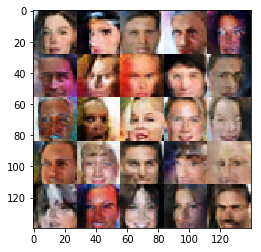

Epoch 1/2... Discriminator Loss: 0.9364... Generator Loss: 0.8044
Epoch 1/2... Discriminator Loss: 1.6124... Generator Loss: 0.3521
Epoch 1/2... Discriminator Loss: 0.5292... Generator Loss: 1.2959
Epoch 1/2... Discriminator Loss: 0.7882... Generator Loss: 1.0891
Epoch 1/2... Discriminator Loss: 0.7860... Generator Loss: 1.0294


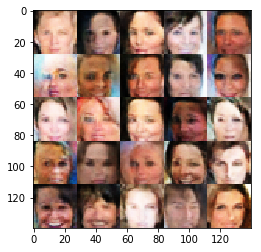

Epoch 1/2... Discriminator Loss: 1.4414... Generator Loss: 0.3557
Epoch 1/2... Discriminator Loss: 0.7287... Generator Loss: 2.2119
Epoch 1/2... Discriminator Loss: 0.9594... Generator Loss: 0.6011
Epoch 2/2... Discriminator Loss: 0.8158... Generator Loss: 0.8651
Epoch 2/2... Discriminator Loss: 1.1854... Generator Loss: 0.6128


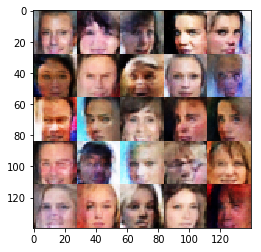

Epoch 2/2... Discriminator Loss: 2.4267... Generator Loss: 0.1060
Epoch 2/2... Discriminator Loss: 0.9543... Generator Loss: 0.7145
Epoch 2/2... Discriminator Loss: 0.6869... Generator Loss: 1.5968
Epoch 2/2... Discriminator Loss: 0.7600... Generator Loss: 0.9462
Epoch 2/2... Discriminator Loss: 0.2555... Generator Loss: 2.8308


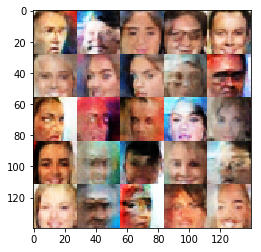

Epoch 2/2... Discriminator Loss: 0.4989... Generator Loss: 1.3947
Epoch 2/2... Discriminator Loss: 1.6775... Generator Loss: 0.2780
Epoch 2/2... Discriminator Loss: 0.9512... Generator Loss: 0.6420
Epoch 2/2... Discriminator Loss: 1.2601... Generator Loss: 0.4489
Epoch 2/2... Discriminator Loss: 0.4032... Generator Loss: 2.0846


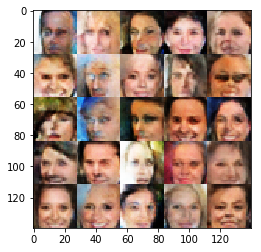

Epoch 2/2... Discriminator Loss: 1.2103... Generator Loss: 0.4552
Epoch 2/2... Discriminator Loss: 1.0505... Generator Loss: 0.6645
Epoch 2/2... Discriminator Loss: 0.4489... Generator Loss: 1.2686
Epoch 2/2... Discriminator Loss: 0.8199... Generator Loss: 0.8147
Epoch 2/2... Discriminator Loss: 0.8216... Generator Loss: 0.7261


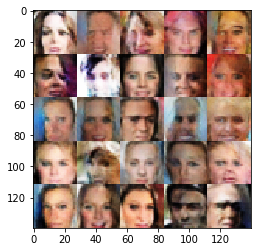

Epoch 2/2... Discriminator Loss: 1.5369... Generator Loss: 0.3572
Epoch 2/2... Discriminator Loss: 1.2427... Generator Loss: 0.4542
Epoch 2/2... Discriminator Loss: 0.6113... Generator Loss: 1.5987
Epoch 2/2... Discriminator Loss: 0.4970... Generator Loss: 1.5928
Epoch 2/2... Discriminator Loss: 0.8547... Generator Loss: 1.1354


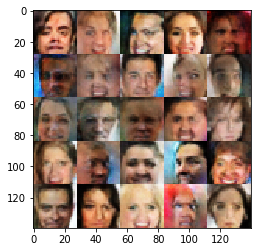

Epoch 2/2... Discriminator Loss: 1.1785... Generator Loss: 0.5557
Epoch 2/2... Discriminator Loss: 0.6787... Generator Loss: 1.0759
Epoch 2/2... Discriminator Loss: 0.7775... Generator Loss: 1.5452
Epoch 2/2... Discriminator Loss: 0.5474... Generator Loss: 1.2919
Epoch 2/2... Discriminator Loss: 0.6760... Generator Loss: 1.1330


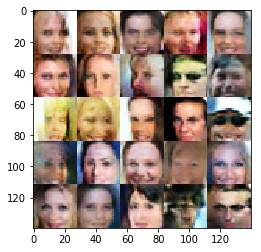

Epoch 2/2... Discriminator Loss: 1.0550... Generator Loss: 1.4013
Epoch 2/2... Discriminator Loss: 0.7156... Generator Loss: 1.0283
Epoch 2/2... Discriminator Loss: 1.7144... Generator Loss: 0.2621
Epoch 2/2... Discriminator Loss: 1.4631... Generator Loss: 0.4408
Epoch 2/2... Discriminator Loss: 1.4581... Generator Loss: 0.3734


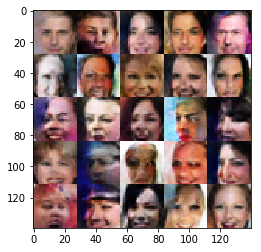

Epoch 2/2... Discriminator Loss: 1.1363... Generator Loss: 0.5026
Epoch 2/2... Discriminator Loss: 1.0789... Generator Loss: 0.5461
Epoch 2/2... Discriminator Loss: 1.2391... Generator Loss: 0.4193
Epoch 2/2... Discriminator Loss: 1.0172... Generator Loss: 0.6291
Epoch 2/2... Discriminator Loss: 1.3326... Generator Loss: 1.8044


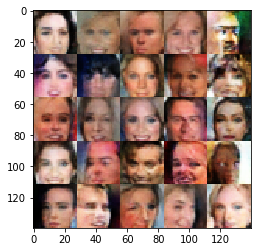

Epoch 2/2... Discriminator Loss: 0.9764... Generator Loss: 0.8696
Epoch 2/2... Discriminator Loss: 0.9351... Generator Loss: 0.9587
Epoch 2/2... Discriminator Loss: 0.6040... Generator Loss: 1.2505
Epoch 2/2... Discriminator Loss: 1.0043... Generator Loss: 0.6266
Epoch 2/2... Discriminator Loss: 1.1817... Generator Loss: 0.6948


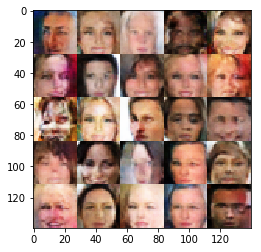

Epoch 2/2... Discriminator Loss: 0.5239... Generator Loss: 1.5629
Epoch 2/2... Discriminator Loss: 3.6322... Generator Loss: 3.2480
Epoch 2/2... Discriminator Loss: 1.8272... Generator Loss: 0.2194
Epoch 2/2... Discriminator Loss: 0.9045... Generator Loss: 0.7511
Epoch 2/2... Discriminator Loss: 1.3433... Generator Loss: 0.4279


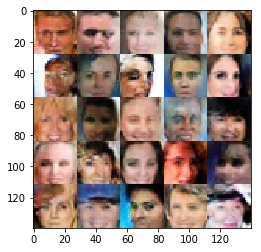

Epoch 2/2... Discriminator Loss: 1.4117... Generator Loss: 0.3549
Epoch 2/2... Discriminator Loss: 1.5201... Generator Loss: 0.3716
Epoch 2/2... Discriminator Loss: 0.2309... Generator Loss: 2.3937
Epoch 2/2... Discriminator Loss: 1.5617... Generator Loss: 0.3740
Epoch 2/2... Discriminator Loss: 1.6458... Generator Loss: 0.3064


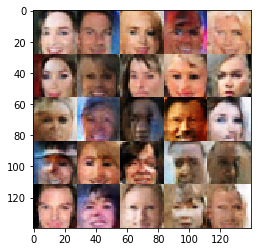

Epoch 2/2... Discriminator Loss: 1.0633... Generator Loss: 0.5817
Epoch 2/2... Discriminator Loss: 0.7573... Generator Loss: 1.4121
Epoch 2/2... Discriminator Loss: 0.3777... Generator Loss: 2.5401
Epoch 2/2... Discriminator Loss: 0.9086... Generator Loss: 1.0205
Epoch 2/2... Discriminator Loss: 0.6460... Generator Loss: 1.3417


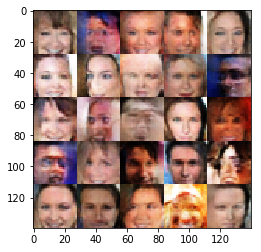

Epoch 2/2... Discriminator Loss: 0.5600... Generator Loss: 1.0729
Epoch 2/2... Discriminator Loss: 1.3794... Generator Loss: 0.4826
Epoch 2/2... Discriminator Loss: 0.6833... Generator Loss: 1.4721
Epoch 2/2... Discriminator Loss: 0.4368... Generator Loss: 1.8906
Epoch 2/2... Discriminator Loss: 1.3330... Generator Loss: 0.4789


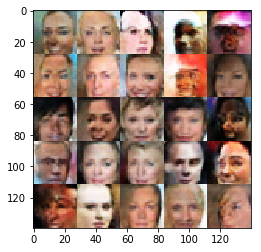

Epoch 2/2... Discriminator Loss: 0.6686... Generator Loss: 1.2474
Epoch 2/2... Discriminator Loss: 0.5899... Generator Loss: 1.1620
Epoch 2/2... Discriminator Loss: 1.1534... Generator Loss: 0.4970
Epoch 2/2... Discriminator Loss: 0.8739... Generator Loss: 1.0490
Epoch 2/2... Discriminator Loss: 2.2376... Generator Loss: 0.1681


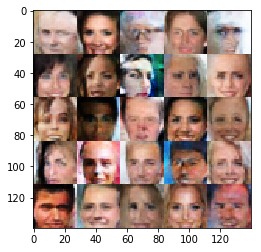

Epoch 2/2... Discriminator Loss: 2.2473... Generator Loss: 0.1518
Epoch 2/2... Discriminator Loss: 0.9057... Generator Loss: 0.7430
Epoch 2/2... Discriminator Loss: 1.1257... Generator Loss: 0.4985
Epoch 2/2... Discriminator Loss: 1.4157... Generator Loss: 0.3603
Epoch 2/2... Discriminator Loss: 0.9279... Generator Loss: 0.6937


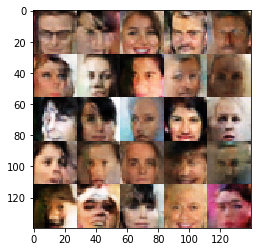

Epoch 2/2... Discriminator Loss: 0.9657... Generator Loss: 0.7327
Epoch 2/2... Discriminator Loss: 0.3860... Generator Loss: 2.2844
Epoch 2/2... Discriminator Loss: 0.7436... Generator Loss: 1.0111
Epoch 2/2... Discriminator Loss: 0.3580... Generator Loss: 2.4470
Epoch 2/2... Discriminator Loss: 1.3092... Generator Loss: 0.4469


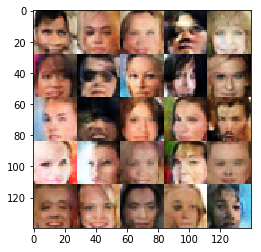

Epoch 2/2... Discriminator Loss: 0.6308... Generator Loss: 1.1946
Epoch 2/2... Discriminator Loss: 0.3916... Generator Loss: 1.7800
Epoch 2/2... Discriminator Loss: 1.7493... Generator Loss: 0.2601
Epoch 2/2... Discriminator Loss: 0.5363... Generator Loss: 1.2769
Epoch 2/2... Discriminator Loss: 0.7705... Generator Loss: 1.0834


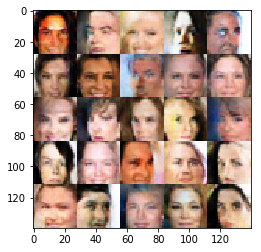

Epoch 2/2... Discriminator Loss: 0.6676... Generator Loss: 1.0794
Epoch 2/2... Discriminator Loss: 1.8509... Generator Loss: 0.2039
Epoch 2/2... Discriminator Loss: 1.8643... Generator Loss: 0.2219
Epoch 2/2... Discriminator Loss: 1.1926... Generator Loss: 0.4918
Epoch 2/2... Discriminator Loss: 0.4854... Generator Loss: 1.3053


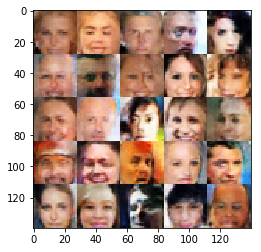

Epoch 2/2... Discriminator Loss: 0.4940... Generator Loss: 1.2122
Epoch 2/2... Discriminator Loss: 0.9563... Generator Loss: 1.8810
Epoch 2/2... Discriminator Loss: 1.1001... Generator Loss: 0.5423
Epoch 2/2... Discriminator Loss: 1.1804... Generator Loss: 0.4712
Epoch 2/2... Discriminator Loss: 0.7559... Generator Loss: 0.8693


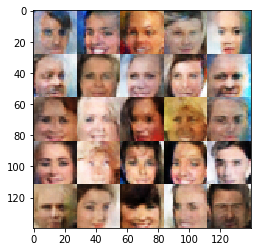

Epoch 2/2... Discriminator Loss: 0.2544... Generator Loss: 2.3158
Epoch 2/2... Discriminator Loss: 0.2691... Generator Loss: 2.0863
Epoch 2/2... Discriminator Loss: 2.2828... Generator Loss: 0.1610
Epoch 2/2... Discriminator Loss: 0.4578... Generator Loss: 1.3959
Epoch 2/2... Discriminator Loss: 1.3279... Generator Loss: 0.4009


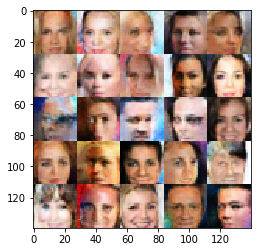

Epoch 2/2... Discriminator Loss: 0.8778... Generator Loss: 0.7612
Epoch 2/2... Discriminator Loss: 1.0927... Generator Loss: 0.5875
Epoch 2/2... Discriminator Loss: 0.4611... Generator Loss: 2.2154
Epoch 2/2... Discriminator Loss: 0.3982... Generator Loss: 1.5256
Epoch 2/2... Discriminator Loss: 0.5505... Generator Loss: 1.3685


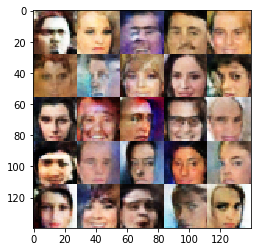

Epoch 2/2... Discriminator Loss: 0.9065... Generator Loss: 0.6742
Epoch 2/2... Discriminator Loss: 2.1032... Generator Loss: 0.1608
Epoch 2/2... Discriminator Loss: 0.8164... Generator Loss: 0.7301
Epoch 2/2... Discriminator Loss: 0.7387... Generator Loss: 0.9392
Epoch 2/2... Discriminator Loss: 1.1725... Generator Loss: 0.5068


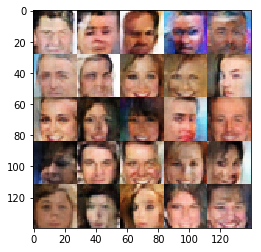

Epoch 2/2... Discriminator Loss: 0.3509... Generator Loss: 1.8307
Epoch 2/2... Discriminator Loss: 0.5303... Generator Loss: 1.2443
Epoch 2/2... Discriminator Loss: 0.4238... Generator Loss: 1.6367
Epoch 2/2... Discriminator Loss: 0.6392... Generator Loss: 1.2263
Epoch 2/2... Discriminator Loss: 0.2878... Generator Loss: 2.0035


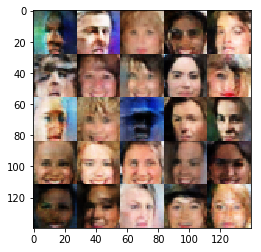

Epoch 2/2... Discriminator Loss: 2.0160... Generator Loss: 0.1786
Epoch 2/2... Discriminator Loss: 0.4414... Generator Loss: 1.5143
Epoch 2/2... Discriminator Loss: 0.9829... Generator Loss: 0.6132
Epoch 2/2... Discriminator Loss: 0.7754... Generator Loss: 0.8813
Epoch 2/2... Discriminator Loss: 0.4571... Generator Loss: 1.5223


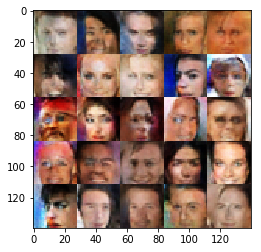

Epoch 2/2... Discriminator Loss: 0.7498... Generator Loss: 0.9895
Epoch 2/2... Discriminator Loss: 0.2661... Generator Loss: 2.3542
Epoch 2/2... Discriminator Loss: 0.6008... Generator Loss: 1.1534
Epoch 2/2... Discriminator Loss: 0.5386... Generator Loss: 1.1134
Epoch 2/2... Discriminator Loss: 0.4416... Generator Loss: 1.5614


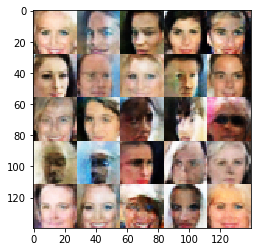

Epoch 2/2... Discriminator Loss: 0.8789... Generator Loss: 0.7579
Epoch 2/2... Discriminator Loss: 0.8109... Generator Loss: 0.9333
Epoch 2/2... Discriminator Loss: 0.9837... Generator Loss: 0.6046
Epoch 2/2... Discriminator Loss: 0.5465... Generator Loss: 1.9924
Epoch 2/2... Discriminator Loss: 1.4652... Generator Loss: 0.3124


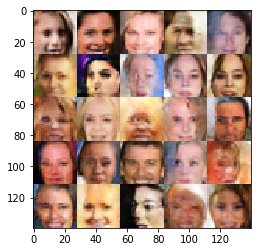

Epoch 2/2... Discriminator Loss: 0.7196... Generator Loss: 0.9460
Epoch 2/2... Discriminator Loss: 1.0178... Generator Loss: 0.6733
Epoch 2/2... Discriminator Loss: 0.9447... Generator Loss: 0.6026
Epoch 2/2... Discriminator Loss: 0.3869... Generator Loss: 1.5334
Epoch 2/2... Discriminator Loss: 0.7537... Generator Loss: 0.8084


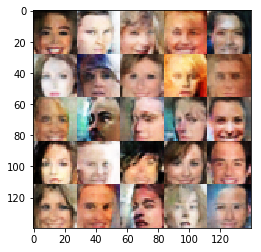

Epoch 2/2... Discriminator Loss: 1.2510... Generator Loss: 0.5464
Epoch 2/2... Discriminator Loss: 1.1042... Generator Loss: 0.5739
Epoch 2/2... Discriminator Loss: 0.6777... Generator Loss: 0.9102
Epoch 2/2... Discriminator Loss: 0.5811... Generator Loss: 1.0752
Epoch 2/2... Discriminator Loss: 0.6037... Generator Loss: 1.1719


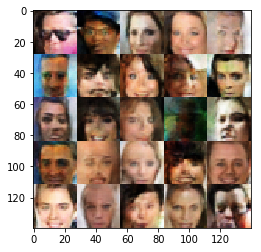

Epoch 2/2... Discriminator Loss: 0.9510... Generator Loss: 0.7139
Epoch 2/2... Discriminator Loss: 0.4912... Generator Loss: 1.5676
Epoch 2/2... Discriminator Loss: 0.4672... Generator Loss: 1.3837
Epoch 2/2... Discriminator Loss: 0.7136... Generator Loss: 0.8773
Epoch 2/2... Discriminator Loss: 0.7224... Generator Loss: 0.9040


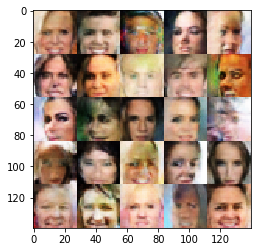

Epoch 2/2... Discriminator Loss: 0.5582... Generator Loss: 2.9789
Epoch 2/2... Discriminator Loss: 1.6845... Generator Loss: 0.2930
Epoch 2/2... Discriminator Loss: 1.4428... Generator Loss: 0.4071
Epoch 2/2... Discriminator Loss: 1.6928... Generator Loss: 0.2958
Epoch 2/2... Discriminator Loss: 2.0355... Generator Loss: 6.0467


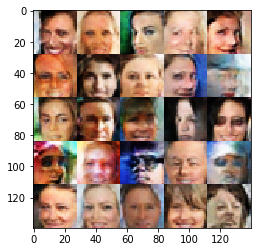

Epoch 2/2... Discriminator Loss: 1.4972... Generator Loss: 0.4031
Epoch 2/2... Discriminator Loss: 0.8544... Generator Loss: 0.9845
Epoch 2/2... Discriminator Loss: 0.4207... Generator Loss: 1.4142
Epoch 2/2... Discriminator Loss: 0.5744... Generator Loss: 0.9829
Epoch 2/2... Discriminator Loss: 1.3243... Generator Loss: 2.4095


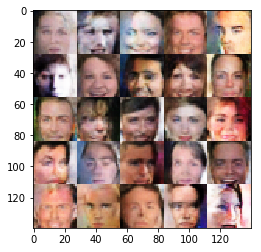

Epoch 2/2... Discriminator Loss: 0.5235... Generator Loss: 1.1074
Epoch 2/2... Discriminator Loss: 1.0403... Generator Loss: 0.6499
Epoch 2/2... Discriminator Loss: 2.3746... Generator Loss: 0.1199
Epoch 2/2... Discriminator Loss: 0.2208... Generator Loss: 2.3966
Epoch 2/2... Discriminator Loss: 0.4153... Generator Loss: 1.9289


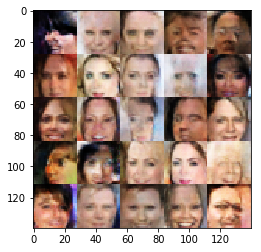

Epoch 2/2... Discriminator Loss: 1.3526... Generator Loss: 0.4191
Epoch 2/2... Discriminator Loss: 0.3927... Generator Loss: 1.7184
Epoch 2/2... Discriminator Loss: 0.8969... Generator Loss: 0.7284
Epoch 2/2... Discriminator Loss: 0.2181... Generator Loss: 2.3459
Epoch 2/2... Discriminator Loss: 0.3810... Generator Loss: 1.6714


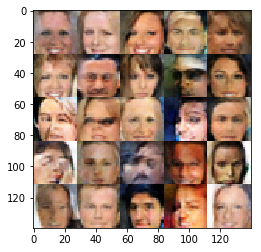

Epoch 2/2... Discriminator Loss: 1.1595... Generator Loss: 0.4692
Epoch 2/2... Discriminator Loss: 1.1530... Generator Loss: 3.6989
Epoch 2/2... Discriminator Loss: 0.9078... Generator Loss: 2.9731
Epoch 2/2... Discriminator Loss: 0.3804... Generator Loss: 2.6681
Epoch 2/2... Discriminator Loss: 0.2228... Generator Loss: 2.4218


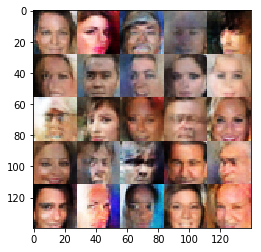

Epoch 2/2... Discriminator Loss: 1.3343... Generator Loss: 0.3644
Epoch 2/2... Discriminator Loss: 0.3573... Generator Loss: 2.3513
Epoch 2/2... Discriminator Loss: 0.7828... Generator Loss: 0.9718
Epoch 2/2... Discriminator Loss: 1.7292... Generator Loss: 0.2989
Epoch 2/2... Discriminator Loss: 1.1467... Generator Loss: 0.5623


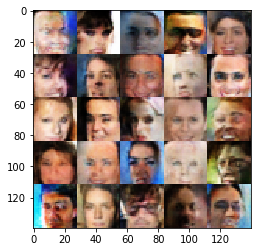

Epoch 2/2... Discriminator Loss: 2.1170... Generator Loss: 0.1500
Epoch 2/2... Discriminator Loss: 0.5583... Generator Loss: 1.2819
Epoch 2/2... Discriminator Loss: 0.8028... Generator Loss: 0.8168
Epoch 2/2... Discriminator Loss: 1.5635... Generator Loss: 0.3783
Epoch 2/2... Discriminator Loss: 1.4281... Generator Loss: 3.2055


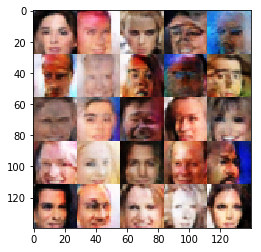

Epoch 2/2... Discriminator Loss: 0.3924... Generator Loss: 1.9332
Epoch 2/2... Discriminator Loss: 0.2062... Generator Loss: 1.9291
Epoch 2/2... Discriminator Loss: 1.8673... Generator Loss: 0.2131
Epoch 2/2... Discriminator Loss: 0.9689... Generator Loss: 0.6382
Epoch 2/2... Discriminator Loss: 0.4583... Generator Loss: 1.2246


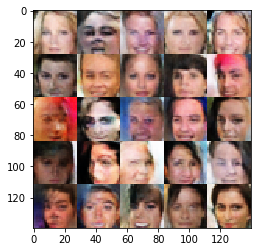

Epoch 2/2... Discriminator Loss: 0.7940... Generator Loss: 0.8472
Epoch 2/2... Discriminator Loss: 0.6347... Generator Loss: 0.9928
Epoch 2/2... Discriminator Loss: 1.8988... Generator Loss: 0.2514
Epoch 2/2... Discriminator Loss: 1.7712... Generator Loss: 0.3140
Epoch 2/2... Discriminator Loss: 0.9551... Generator Loss: 0.6388


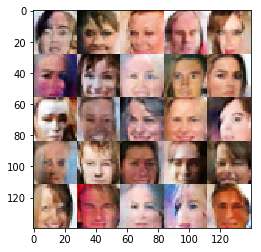

Epoch 2/2... Discriminator Loss: 1.2225... Generator Loss: 0.5474
Epoch 2/2... Discriminator Loss: 0.4539... Generator Loss: 1.8924
Epoch 2/2... Discriminator Loss: 0.3908... Generator Loss: 1.8331
Epoch 2/2... Discriminator Loss: 0.2883... Generator Loss: 2.8364
Epoch 2/2... Discriminator Loss: 1.0494... Generator Loss: 0.5372


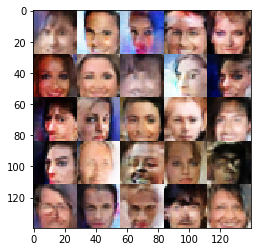

Epoch 2/2... Discriminator Loss: 0.6719... Generator Loss: 1.1636
Epoch 2/2... Discriminator Loss: 0.8306... Generator Loss: 0.8592
Epoch 2/2... Discriminator Loss: 0.7541... Generator Loss: 1.0723
Epoch 2/2... Discriminator Loss: 0.8708... Generator Loss: 0.8105
Epoch 2/2... Discriminator Loss: 2.1050... Generator Loss: 0.1685


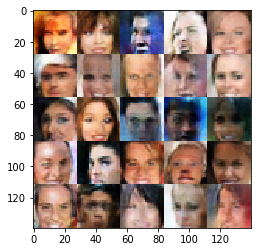

Epoch 2/2... Discriminator Loss: 0.7946... Generator Loss: 1.2456
Epoch 2/2... Discriminator Loss: 0.2996... Generator Loss: 1.8654
Epoch 2/2... Discriminator Loss: 0.4720... Generator Loss: 1.9233
Epoch 2/2... Discriminator Loss: 0.6210... Generator Loss: 2.0574
Epoch 2/2... Discriminator Loss: 0.2574... Generator Loss: 2.2295


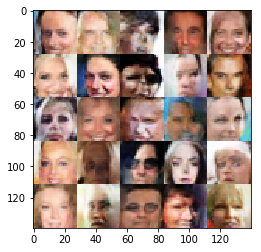

Epoch 2/2... Discriminator Loss: 0.1518... Generator Loss: 2.4451
Epoch 2/2... Discriminator Loss: 0.6019... Generator Loss: 0.9741
Epoch 2/2... Discriminator Loss: 0.1619... Generator Loss: 2.4645
Epoch 2/2... Discriminator Loss: 0.4202... Generator Loss: 2.4024
Epoch 2/2... Discriminator Loss: 1.0498... Generator Loss: 0.6137


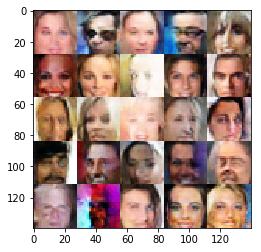

Epoch 2/2... Discriminator Loss: 1.6739... Generator Loss: 0.2902
Epoch 2/2... Discriminator Loss: 1.2039... Generator Loss: 0.5401
Epoch 2/2... Discriminator Loss: 0.3289... Generator Loss: 1.5055
Epoch 2/2... Discriminator Loss: 0.5459... Generator Loss: 1.5168
Epoch 2/2... Discriminator Loss: 0.9339... Generator Loss: 0.5896


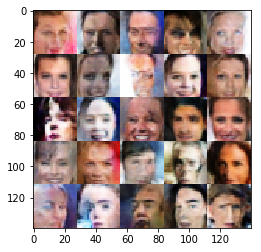

Epoch 2/2... Discriminator Loss: 1.0097... Generator Loss: 0.6900
Epoch 2/2... Discriminator Loss: 1.7303... Generator Loss: 0.3192
Epoch 2/2... Discriminator Loss: 0.6344... Generator Loss: 1.1319
Epoch 2/2... Discriminator Loss: 0.3224... Generator Loss: 2.5992
Epoch 2/2... Discriminator Loss: 0.3650... Generator Loss: 1.7330


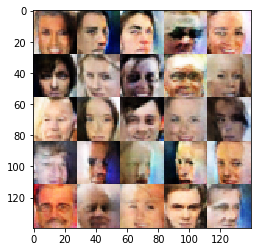

Epoch 2/2... Discriminator Loss: 0.8494... Generator Loss: 0.6582
Epoch 2/2... Discriminator Loss: 0.6988... Generator Loss: 0.9757
Epoch 2/2... Discriminator Loss: 0.8244... Generator Loss: 0.8997
Epoch 2/2... Discriminator Loss: 0.3741... Generator Loss: 3.1072
Epoch 2/2... Discriminator Loss: 1.8493... Generator Loss: 0.2907


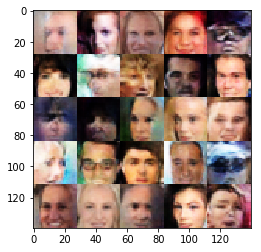

Epoch 2/2... Discriminator Loss: 1.1438... Generator Loss: 0.5322
Epoch 2/2... Discriminator Loss: 1.4486... Generator Loss: 0.4339
Epoch 2/2... Discriminator Loss: 0.3424... Generator Loss: 1.7104
Epoch 2/2... Discriminator Loss: 2.7556... Generator Loss: 0.1772
Epoch 2/2... Discriminator Loss: 0.9491... Generator Loss: 0.6731


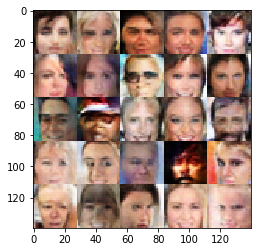

Epoch 2/2... Discriminator Loss: 0.6866... Generator Loss: 1.1505
Epoch 2/2... Discriminator Loss: 0.5317... Generator Loss: 1.2294
Epoch 2/2... Discriminator Loss: 0.2548... Generator Loss: 2.0312
Epoch 2/2... Discriminator Loss: 0.2884... Generator Loss: 1.9421
Epoch 2/2... Discriminator Loss: 2.7683... Generator Loss: 0.1013


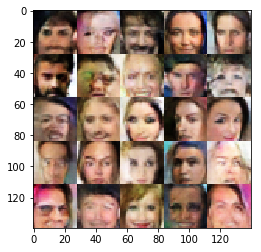

Epoch 2/2... Discriminator Loss: 1.0701... Generator Loss: 0.5266
Epoch 2/2... Discriminator Loss: 0.8782... Generator Loss: 0.6569
Epoch 2/2... Discriminator Loss: 0.4419... Generator Loss: 1.5767
Epoch 2/2... Discriminator Loss: 0.3562... Generator Loss: 1.5109
Epoch 2/2... Discriminator Loss: 0.8586... Generator Loss: 0.8640


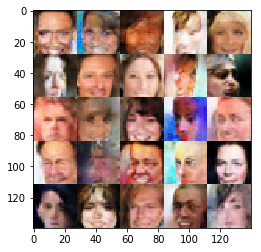

Epoch 2/2... Discriminator Loss: 0.3219... Generator Loss: 2.0883
Epoch 2/2... Discriminator Loss: 1.1890... Generator Loss: 0.5199
Epoch 2/2... Discriminator Loss: 0.7756... Generator Loss: 0.7943
Epoch 2/2... Discriminator Loss: 0.8218... Generator Loss: 0.8350
Epoch 2/2... Discriminator Loss: 0.9301... Generator Loss: 0.7377


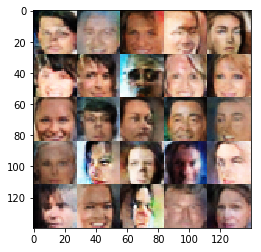

Epoch 2/2... Discriminator Loss: 0.8696... Generator Loss: 0.8490
Epoch 2/2... Discriminator Loss: 0.6865... Generator Loss: 1.1159
Epoch 2/2... Discriminator Loss: 0.7724... Generator Loss: 0.8936
Epoch 2/2... Discriminator Loss: 0.9585... Generator Loss: 0.7246
Epoch 2/2... Discriminator Loss: 0.2269... Generator Loss: 2.0537


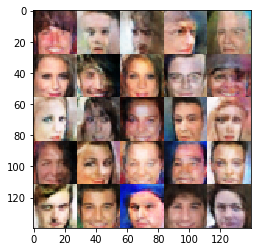

Epoch 2/2... Discriminator Loss: 1.0619... Generator Loss: 0.5200
Epoch 2/2... Discriminator Loss: 0.1046... Generator Loss: 3.0410
Epoch 2/2... Discriminator Loss: 0.5602... Generator Loss: 1.6225
Epoch 2/2... Discriminator Loss: 0.2958... Generator Loss: 1.9424
Epoch 2/2... Discriminator Loss: 0.6209... Generator Loss: 0.9783


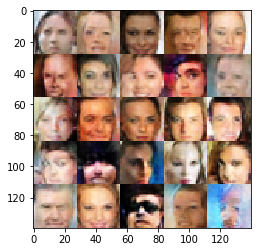

Epoch 2/2... Discriminator Loss: 0.3383... Generator Loss: 1.8652


In [17]:
batch_size = 16
z_dim = 112
learning_rate = 0.00045
beta1 = 0.3


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 2

celeba_dataset = helper.Dataset('celeba', glob(os.path.join(data_dir, 'img_align_celeba/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, celeba_dataset.get_batches,
          celeba_dataset.shape, celeba_dataset.image_mode)

### Submitting This Project
When submitting this project, make sure to run all the cells before saving the notebook. Save the notebook file as "dlnd_face_generation.ipynb" and save it as a HTML file under "File" -> "Download as". Include the "helper.py" and "problem_unittests.py" files in your submission.